In [ ]:
# !pip install pdfplumber
# !pip install PyMuPDF
# !pip install pytesseract
# !pip install tqdm
# !pip install opencv-python
# !pip install webcolors

In [1]:
import os

os.environ["HF_HOME"] = "D:/huggingface"
os.environ["TRANSFORMERS_CACHE"] = "D:/huggingface/models"
os.environ["HF_HUB_CACHE"] = "D:/huggingface/hub"
os.environ["TORCH_HOME"] = "D:/torch"
os.environ["DIFFUSERS_CACHE"] = "D:/diffusers"

# Описание
Сервис генерации изображений на основе текстовых описаний для помощи дизайнерам и маркетологам в создании визуального контента, соответствующего корпоративным стандартам и бренд-буку.

файлы можно посмотреть тут https://drive.google.com/drive/folders/1QwehfV1H0pQNVFckW7iEwM8xu9v6WMRi?usp=share_link

In [ ]:
# !pip install scikit-learn

# Обработка и анализ данных

In [ ]:
# %%writefile processing_brandbooks.py
import fitz  # PyMuPDF
import os
import logging
from typing import List, Dict, Union
from PIL import Image
import pytesseract
import cv2
import numpy as np
from sklearn.cluster import KMeans
from collections import Counter
from sklearn.metrics import silhouette_score
from webcolors import rgb_to_hex
from concurrent.futures import ProcessPoolExecutor

# Настройка логирования
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s [%(levelname)s] %(message)s',
    handlers=[logging.StreamHandler()]
)

# Функции для извлечения цветов
def get_image(image_path):
    """Загружает изображение и преобразует в RGB"""
    image = cv2.imread(image_path)
    if image is None:
        raise FileNotFoundError(f"Не удалось загрузить изображение: {image_path}")
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

def preprocess_image(image):
    """Преобразует изображение в плоский массив пикселей"""
    return image.reshape((image.shape[0] * image.shape[1], 3))

def auto_k_selection(image, max_k=6, sample_size=5000):
    """Автоматический выбор количества кластеров (k)"""
    logging.info(f"Начало автоматического выбора количества кластеров (max_k={max_k})")

    if len(image) > sample_size:
        np.random.shuffle(image)
        image = image[:sample_size]

    best_k = 2
    max_score = -np.inf
    possible_ks = [2, 3, 4, 5]

    for k in possible_ks:
        if k > len(image):
            continue
        kmeans = KMeans(n_clusters=k, n_init=3, init='random')
        labels = kmeans.fit_predict(image)
        score = -kmeans.inertia_
        logging.debug(f"k={k}, Inertia Score: {score:.2f}")
        if score > max_score:
            max_score = score
            best_k = k

    logging.info(f"Оптимальное количество кластеров: {best_k}")
    return best_k

def is_background_color(rgb, threshold=50):
    """Проверяет, является ли цвет фоном (черный или белый)"""
    white_dist = np.linalg.norm(np.array(rgb) - np.array([255, 255, 255]))
    black_dist = np.linalg.norm(np.array(rgb) - np.array([0, 0, 0]))
    return white_dist < threshold or black_dist < threshold

def get_dominant_colors(image, max_k=6, bg_threshold=50, sample_size=10000):
    """Извлечение основных цветов изображения без фона"""
    logging.info("Извлечение доминирующих цветов...")

    if len(image) > sample_size:
        np.random.shuffle(image)
        image = image[:sample_size]

    k = auto_k_selection(image, max_k)

    clf = KMeans(n_clusters=k, n_init=3, init='random')
    labels = clf.fit_predict(image)
    counts = Counter(labels)

    clusters = list(zip(counts.values(), clf.cluster_centers_))
    clusters.sort(key=lambda x: x[0], reverse=True)

    filtered_colors = []
    for count, color in clusters:
        rgb = np.array(color).astype(int).tolist()
        if not is_background_color(rgb, bg_threshold):
            filtered_colors.append(rgb)

    if filtered_colors:
        logging.info(f"Найдено {len(filtered_colors)} основных цветов (без фона)")
    else:
        logging.warning("Все найденные цвета — фоновые. Возвращается пустой список.")
    return [rgb_to_hex(color) for color in filtered_colors]

def extract_colors(image_path, num_colors=5):
    """Получение HEX-цветов из изображения по пути"""
    try:
        logging.info(f"Извлечение цветовой палитры из {image_path}")
        image = get_image(image_path)
        processed_image = preprocess_image(image)
        colors = get_dominant_colors(processed_image, num_colors)
        return colors
    except Exception as e:
        logging.error(f"Ошибка при обработке изображения {image_path}: {e}")
        return []

# Основная функция обработки PDF
def process_brandbook(pdf_path: str, output_folder: str = "brandbook_images") -> List[Dict]:
    """
    Обработка PDF-брендбука:
    1. Извлечение текста
    2. Извлечение изображений и OCR
    3. Если текст и изображения отсутствуют — делает скриншот страницы
    """
    file_name = os.path.basename(pdf_path)
    base_name = os.path.splitext(file_name)[0]
    logging.info(f"Обработка файла: {pdf_path}")
    logging.info(f"Формирование выходной директории: {output_folder}")
    output_folder = os.path.join(output_folder, base_name)
    os.makedirs(output_folder, exist_ok=True)

    data = []
    doc = fitz.open(pdf_path)
    total_pages = len(doc)
    logging.info(f"Загружено {total_pages} страниц")

    for page_num in range(total_pages):
        logging.info(f"--- Обработка страницы {page_num + 1}/{total_pages} ---")
        page = doc.load_page(page_num)
        page_text = page.get_text().strip()
        image_list = page.get_images(full=True)

        # 1. Обработка текста
        if page_text:
            logging.info(f"[Страница {page_num + 1}] Найден текст (длина: {len(page_text)})")
            data.append({
                "type": "text",
                "content": page_text,
                "page": page_num + 1
            })
        else:
            logging.info(f"[Страница {page_num + 1}] Текст не найден")

        # 2. Обработка встроенных изображений
        if image_list:
            logging.info(f"[Страница {page_num + 1}] Найдено {len(image_list)} изображений")
        else:
            logging.info(f"[Страница {page_num + 1}] Изображения не найдены")

        cnt = 0
        for img in image_list:
            xref = img[0]
            width, height = img[2], img[3]
            if width < 40 or height < 40:
                logging.debug(f"[Страница {page_num + 1}] Пропущено маленькое изображение (xref={xref})")
                continue

            logging.info(f"[Страница {page_num + 1}] Извлечение изображения xref={xref}")
            image = doc.extract_image(xref)
            image_path = os.path.join(output_folder, f"page{page_num+1}_img{cnt}.png")
            cnt += 1

            # Сохраняем изображение перед обработкой
            with open(image_path, "wb") as f:
                f.write(image["image"])

            # Теперь можно читать
            hex_colors = extract_colors(image_path, num_colors=6)
            if hex_colors:
                logging.info(f"[Изображение {image_path}] Найдены цвета: {hex_colors}")
                data.append({
                    "type": "page_colors_image",
                    "content": hex_colors,
                    "page": page_num + 1,
                    "image_path": image_path
                })
            else:
                logging.warning(f"[Страница {page_num + 1}] Цвета не найдены или все фоновые")

            # OCR для изображения
            try:
                ocr_text = pytesseract.image_to_string(Image.open(image_path), lang='rus+eng').strip()
                if ocr_text:
                    logging.info(f"[Страница {page_num + 1}] OCR: найден текст длиной {len(ocr_text)}")
                    data.append({
                        "type": "ocr_text",
                        "content": ocr_text,
                        "page": page_num + 1,
                        "image_path": image_path
                    })
                else:
                    logging.debug(f"[Страница {page_num + 1}] OCR: текст не распознан")
            except Exception as e:
                logging.error(f"[Страница {page_num + 1}] OCR error: {e}")

        # 3. Если нет текста и изображений — делаем скриншот
        if not page_text and not image_list:
            logging.warning(f"[Страница {page_num + 1}] Нет текста и изображений. Сохраняю скриншот.")
            pix = page.get_pixmap(dpi=300)
            image_path = os.path.join(output_folder, f"page{page_num+1}_full.png")
            pix.save(image_path)

            # OCR для скриншота
            try:
                ocr_text_scrin = pytesseract.image_to_string(Image.open(image_path), lang='rus+eng').strip()
                if ocr_text_scrin:
                    logging.info(f"[Страница {page_num + 1}] OCR (скрин): найден текст длиной {len(ocr_text_scrin)}")
                    data.append({
                        "type": "ocr_text_scrin",
                        "content": ocr_text_scrin,
                        "page": page_num + 1,
                        "image_path": image_path
                    })
                else:
                    logging.debug(f"[Страница {page_num + 1}] OCR (скрин): текст не распознан")
            except Exception as e:
                logging.error(f"[Страница {page_num + 1}] OCR (скрин) error: {e}")

            # Извлечение HEX-цветов со скрина
            logging.info(f"[Страница {page_num + 1}] Извлечение цветов с изображения")
            hex_colors = extract_colors(image_path, num_colors=6)
            if hex_colors:
                logging.info(f"[Страница {page_num + 1}] Найдены цвета: {hex_colors}")
                data.append({
                    "type": "page_colors_scrin",
                    "content": hex_colors,
                    "page": page_num + 1,
                    "image_path": image_path
                })
            else:
                logging.warning(f"[Страница {page_num + 1}] Цвета не найдены или все фоновые")

    logging.info("===Обработка завершена===")
    return data

In [ ]:
import time

pdf_files = ["2.pdf",
             "3.pdf",
             "4.pdf"]

start_time = time.time()
results = []
for pdf_file in pdf_files:
    print(f"Обработка файла: {pdf_file}")
    result = process_brandbook(pdf_file)
    results.append({"filename": os.path.basename(pdf_file), "data": result})
end_time = time.time()

execution_time = end_time - start_time
print(f"Время выполнения функции: {execution_time:.2f} секунд")



2025-05-18 20:06:05,737 [INFO] Обработка файла: 2.pdf
2025-05-18 20:06:05,738 [INFO] Формирование выходной директории: brandbook_images
2025-05-18 20:06:05,741 [INFO] Загружено 29 страниц
2025-05-18 20:06:05,741 [INFO] --- Обработка страницы 1/29 ---
2025-05-18 20:06:05,786 [INFO] [Страница 1] Найден текст (длина: 126)
2025-05-18 20:06:05,786 [INFO] [Страница 1] Найдено 1 изображений
2025-05-18 20:06:05,787 [INFO] [Страница 1] Извлечение изображения xref=931
2025-05-18 20:06:05,789 [INFO] Извлечение цветовой палитры из brandbook_images/2/page1_img0.png
2025-05-18 20:06:05,794 [INFO] Извлечение доминирующих цветов...


Обработка файла: 2.pdf


2025-05-18 20:06:06,824 [INFO] Начало автоматического выбора количества кластеров (max_k=6)
2025-05-18 20:06:06,899 [INFO] Оптимальное количество кластеров: 5
2025-05-18 20:06:06,931 [INFO] Найдено 5 основных цветов (без фона)
2025-05-18 20:06:06,932 [INFO] [Изображение brandbook_images/2/page1_img0.png] Найдены цвета: ['#eb2e03', '#ce2505', '#f24114', '#961000', '#aa1b05']
2025-05-18 20:06:07,643 [INFO] --- Обработка страницы 2/29 ---
2025-05-18 20:06:07,680 [INFO] [Страница 2] Найден текст (длина: 793)
2025-05-18 20:06:07,680 [INFO] [Страница 2] Найдено 1 изображений
2025-05-18 20:06:07,681 [INFO] --- Обработка страницы 3/29 ---
2025-05-18 20:06:07,682 [INFO] [Страница 3] Найден текст (длина: 352)
2025-05-18 20:06:07,682 [INFO] [Страница 3] Найдено 1 изображений
2025-05-18 20:06:07,682 [INFO] [Страница 3] Извлечение изображения xref=11
2025-05-18 20:06:07,683 [INFO] Извлечение цветовой палитры из brandbook_images/2/page3_img0.png
2025-05-18 20:06:07,691 [INFO] Извлечение доминирующих

Обработка файла: 3.pdf


2025-05-18 20:06:50,558 [INFO] [Страница 1] OCR (скрин): найден текст длиной 16
2025-05-18 20:06:50,559 [INFO] [Страница 1] Извлечение цветов с изображения
2025-05-18 20:06:50,559 [INFO] Извлечение цветовой палитры из brandbook_images/3/page1_full.png
2025-05-18 20:06:50,689 [INFO] Извлечение доминирующих цветов...
2025-05-18 20:07:15,021 [INFO] Начало автоматического выбора количества кластеров (max_k=6)
/Users/annausova/Desktop/ML/itmo/itmo_venv/lib/python3.11/site-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (4). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
/Users/annausova/Desktop/ML/itmo/itmo_venv/lib/python3.11/site-packages/sklearn/base.py:1389: ConvergenceWarning: Number of distinct clusters (3) found smaller than n_clusters (5). Possibly due to duplicate points in X.
  return fit_method(estimator, *args, **kwargs)
2025-05-18 20:07:15,150 [INFO] Оптимальное количество к

Обработка файла: 4.pdf


2025-05-18 20:15:20,659 [INFO] Начало автоматического выбора количества кластеров (max_k=6)
2025-05-18 20:15:20,800 [INFO] Оптимальное количество кластеров: 5
2025-05-18 20:15:20,858 [INFO] Найдено 5 основных цветов (без фона)
2025-05-18 20:15:20,858 [INFO] [Изображение brandbook_images/4/page1_img0.png] Найдены цвета: ['#356529', '#305e26', '#3b6f2e', '#2a5621', '#244e1d']
2025-05-18 20:15:21,148 [INFO] --- Обработка страницы 2/162 ---
2025-05-18 20:15:21,150 [INFO] [Страница 2] Найден текст (длина: 885)
2025-05-18 20:15:21,151 [INFO] [Страница 2] Изображения не найдены
2025-05-18 20:15:21,151 [INFO] --- Обработка страницы 3/162 ---
2025-05-18 20:15:21,151 [INFO] [Страница 3] Найден текст (длина: 13)
2025-05-18 20:15:21,151 [INFO] [Страница 3] Изображения не найдены
2025-05-18 20:15:21,152 [INFO] --- Обработка страницы 4/162 ---
2025-05-18 20:15:21,153 [INFO] [Страница 4] Найден текст (длина: 1129)
2025-05-18 20:15:21,153 [INFO] [Страница 4] Найдено 1 изображений
2025-05-18 20:15:21,1

Время выполнения функции: 785.53 секунд


In [ ]:
# print(results)

#проверка результатов
for data_dict in results:
    filename = data_dict["filename"]
    print(f"\nФайл: {filename}")

    for item in data_dict["data"]:
        item_type = item["type"]
        page = item.get("page", "N/A")

        if item_type == "text":
            print(f"  Страница {page}, Текст: {item['content'][:30]}...")  # ограничим
        elif item_type == "ocr_text" or item_type == "ocr_text_scrin":
            print(f"  Страница {page}, OCR текст: {item['content'][:30]}...")
        elif item_type == "page_colors_scrin":
            print(f"  Страница {page}, Цвета: {item['content']}")
        else:
            print(f"  Страница {page}, Тип: {item_type}")


Файл: 2.pdf
  Страница 1, Текст: Руководство  
по использованию...
  Страница 1, Тип: page_colors_image
  Страница 2, Текст: Содержание
О Большом театре 
6...
  Страница 3, Текст: 5
6
О Большом театре
Государст...
  Страница 3, Тип: page_colors_image
  Страница 4, Текст: 7
8
Логотип
Логотип театра — о...
  Страница 5, Текст: 9
10
Знак
Знак представляет со...
  Страница 6, Текст: 11
12
Базовый логотип
Базовый ...
  Страница 7, Текст: 13
14
Вертикальный вариант
В б...
  Страница 8, Текст: 15
16
Парадная версия логотипа...
  Страница 9, Текст: 17
18
Триумфальный логотип
Сам...
  Страница 10, Текст: 19
20
Английские логотипы
Все ...
  Страница 11, Текст: 21
22
Логотип на темном фоне
Д...
  Страница 11, Тип: page_colors_image
  Страница 12, Текст: 23
24
Колорированный логотип
С...
  Страница 13, Текст: Текстовый логотип также допуск...
  Страница 13, Тип: page_colors_image
  Страница 14, Текст: Фирменные цвета
У Большого два...
  Страница 14, Тип: page_colors_image
  Страница 14, OCR текст

In [ ]:
print(results[1])

{'filename': '3.pdf', 'data': [{'type': 'ocr_text_scrin', 'content': 'Альфа Банк\n\n2024', 'page': 1, 'image_path': 'brandbook_images/3/page1_full.png'}, {'type': 'page_colors_scrin', 'content': ['#ee3023', '#f9bab5'], 'page': 1, 'image_path': 'brandbook_images/3/page1_full.png'}, {'type': 'ocr_text_scrin', 'content': 'Новые цвета\n\nPantone 485 CU\n\nPure cyan\n\nHex #20EAE7\nВСВ 32, 234, 231\nCMYK 57, 0, 27,0\n\nWhite\nHex #090906\nКСВ 217, 217, 214\n\nCMYK 0, 0, 0, 0\n\nBlack\n\nHex\nRGB\n\n#000000\n0,0,0\nCMYK 50,50,50, 100\n\n#EF 3124\n\nHex\nRGB 239, 49, 36\nCMYK 0,100,100, 0\n\nWhite\nHex HFFFFFF\nRGB 255, 255, 255\n\nCMYK 0, 0, 0, 0', 'page': 2, 'image_path': 'brandbook_images/3/page2_full.png'}, {'type': 'page_colors_scrin', 'content': ['#ae3861', '#1ee9e6', '#ebfe00'], 'page': 2, 'image_path': 'brandbook_images/3/page2_full.png'}, {'type': 'ocr_text_scrin', 'content': 'Правила\n\nСуществующая палитра сохраняется и расширяется. Основная\nлинеика — красный, черныи, и три дополн

In [ ]:
from collections import defaultdict
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import re

def is_valid_hex(color: str) -> bool:
    """Проверяет корректность HEX-цвета"""
    if not color.startswith('#'):
        return False
    hex_code = color[1:]
    return len(hex_code) == 6 and all(c in '0123456789ABCDEFabcdef' for c in hex_code)

def hex_to_rgb(hex_color):
    """Преобразует HEX в RGB"""
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

def process_colors(results):
    """
    Извлекает цвета из всех файлов и страниц
    :param results: Результат работы функции по обработке брендбуков
    :return: { filename: { page: [hex_color1, hex_color2, ...] }, ... }
    """
    color_registry = defaultdict(dict)  # { filename: { page: [colors] } }
    invalid_colors = []

    for file_data in results:
        filename = file_data["filename"]
        data = file_data.get("data", [])

        for entry in data:
            if entry.get("type") == "page_colors_scrin" or entry.get("type") == "page_colors_image":
                page = entry["page"]
                colors = entry["content"]

                valid_colors = []
                for color in colors:
                    if is_valid_hex(color):
                        valid_colors.append(color)
                    else:
                        invalid_colors.append((filename, page, color))

                if valid_colors:
                    color_registry[filename][page] = valid_colors

    return dict(color_registry), invalid_colors


def visualize_colors(color_registry):
    """
    Визуализирует цветовые палитры по файлам и страницам
    :param color_registry: { filename: { page: [color1, color2, ...] } }
    """
    for filename, pages in color_registry.items():
        print(f"\nЦветовая палитра: {filename}")
        n_pages = len(pages)
        fig, axes = plt.subplots(n_pages, 1, figsize=(12, 2 * n_pages))

        if n_pages == 1:
            axes = [axes]

        for ax, (page, colors) in zip(axes, pages.items()):
            ax.set_title(f"Page {page}")
            for i, color in enumerate(colors):
                ax.add_patch(patches.Rectangle(
                    (i*60, 0), 60, 100,
                    color=color,
                    label=f"{color}\nRGB{hex_to_rgb(color)}"
                ))
            ax.set_xlim(0, len(colors)*60)
            ax.set_ylim(0, 100)
            ax.axis('off')
            ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=3)

        plt.tight_layout()
        plt.show()

# Извлечение цветов из результатов
color_registry, invalid_colors = process_colors(results)

# Вывод некорректных цветов
if invalid_colors:
    print("===Некорректные цвета:===")
    for filename, page, color in invalid_colors:
        print(f"Файл: {filename}, Страница: {page}, Цвет: {color}")




Цветовая палитра: 2.pdf


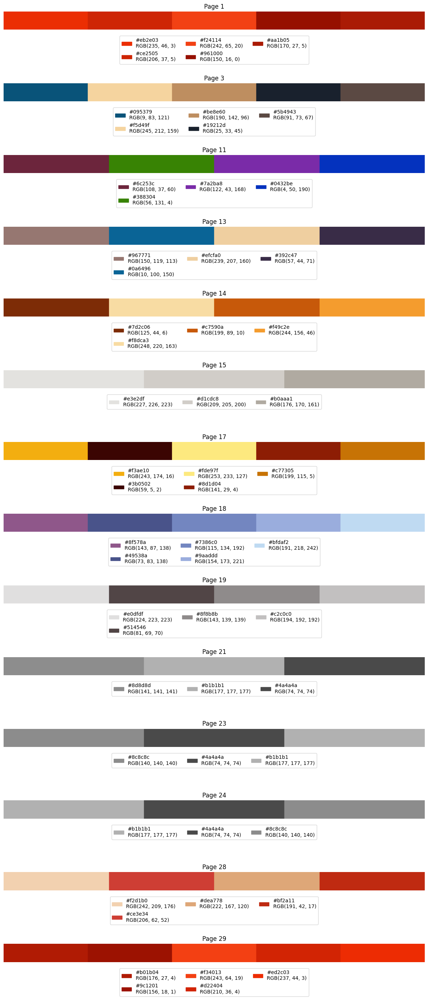


Цветовая палитра: 3.pdf


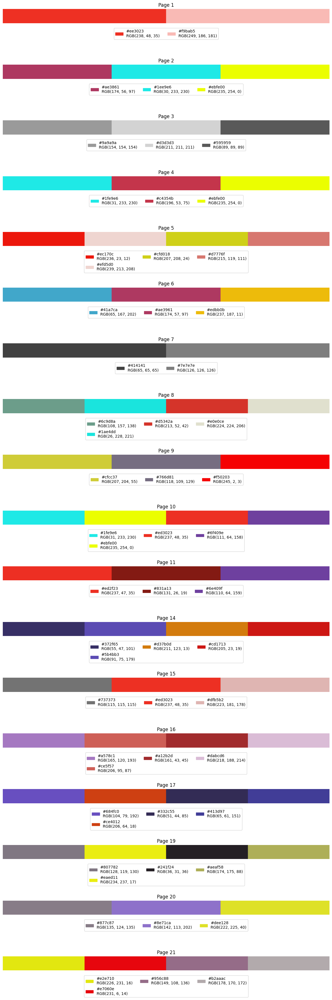


Цветовая палитра: 4.pdf


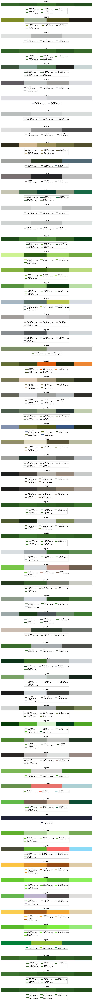

In [ ]:
# Визуализацируем
visualize_colors(color_registry)

# Фичамейкинг на основе обработанных брендбуков

In [ ]:
# !pip install sentence_transformers

   ---------------------------------------- 0.0/10.4 MB ? eta -:--:--
   ---------------------------------------- 10.4/10.4 MB 67.2 MB/s eta 0:00:00
   ---------------------------------------- 0.0/2.4 MB ? eta -:--:--
   ---------------------------------------- 2.4/2.4 MB 62.9 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import torch
if torch.backends.mps.is_available():
    print("MPS доступен")
elif torch.cuda.is_available():
    print("CUDA доступен")
else:
    print("Используется CPU")

CUDA доступен


In [ ]:
from sentence_transformers import SentenceTransformer, util
import re

# Модель для семантической классификации
model = SentenceTransformer('all-MiniLM-L6-v2')

# эталонные запросы - на их основе преобразуем выход функции по обработке брендбука
queries = {
    "color": "HEX-коды цветов, например #FF0000",
    "style": "графический стиль, дизайн, оформление, визуальная тема",
    "font": "шрифт, типографика, начертание",
    "restriction": "запрещено использовать, не применять, ограничения",
    "slogan": "рекламный слоган, фраза бренда",
    "logo": "логотип, описание знака, фирменный знак"
}

# Векторизация
query_embeddings = {k: model.encode(v, convert_to_tensor=True) for k, v in queries.items()}

/Users/annausova/Desktop/ML/itmo/itmo_venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-05-18 20:19:21,749 [INFO] PyTorch version 2.6.0 available.
2025-05-18 20:19:21,750 [INFO] TensorFlow version 2.19.0 available.
2025-05-18 20:19:22,012 [INFO] Use pytorch device_name: mps
2025-05-18 20:19:22,012 [INFO] Load pretrained SentenceTransformer: all-MiniLM-L6-v2
Batches: 100%|██████████| 1/1 [00:00<00:00, 16.82it/s]


In [ ]:
# Вспомогательные функции
# Функция для преобразования HEX в RGB
def hex_to_rgb_full(hex_color):
    hex_color = hex_color.lstrip('#')
    if len(hex_color) == 3:
        hex_color = ''.join([c * 2 for c in hex_color])  # включаем такие преобразрвания цвета #EDF → #EEDDFF
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

# Извлечение HEX-цветов из текста
def extract_hex_colors(text):
    return re.findall(r'#(?:[0-9a-fA-F]{3}){2}|#[0-9a-fA-F]{3}', text)

def classify_text(text):
    """Функция классификации текста"""
    if not text.strip():
        return "other"

    text_emb = model.encode([text], convert_to_tensor=True)
    best_match = None
    best_score = 0.5  # порог уверенности

    for q_type, q_emb in query_embeddings.items():
        score = util.cos_sim(text_emb, q_emb).item()
        if score > best_score:
            best_score = score
            best_match = q_type

    return best_match or "other"


In [ ]:
import numpy as np
from sklearn.cluster import KMeans
import re
from collections import Counter

def extract_brandbook_features(data):
    """
    data — список словарей (data = results[0]['data'])
    Возвращает словарь с полным текстом, всеми цветами и категоризованными частями
    """
    full_text = ""
    colors = []
    image_paths = []

    # 1. Сбор всего текста и цветов
    for entry in data:
        if entry["type"] in ["text", "ocr_text", "ocr_text_scrin"]:
            text = entry.get("content", "").strip()
            if text:
                full_text += " " + text

        elif entry["type"] in ["page_colors_image", "page_colors_scrin"]:
            colors.extend(entry.get("content", []))

        # Записываем пути к изображениям
        if "image_path" in entry:
            image_paths.append({
                "path": entry["image_path"],
                "type": entry["type"]
            })

    # 2. Извлечение HEX-цветов из текста
    detected_colors = extract_hex_colors(full_text)
    all_colors = list(set(colors + detected_colors))

    # 3. Кластеризация цветов
    main_colors = []
    if all_colors:
        rgb_colors = [hex_to_rgb_full(c) for c in all_colors]
        X = np.array(rgb_colors)

        n_clusters = min(9, len(X))
        kmeans = KMeans(n_clusters=n_clusters, n_init=10).fit(X)
        labels = kmeans.labels_
        main_centers = kmeans.cluster_centers_

        cluster_freq = Counter(labels)
        freq_list = [(freq, tuple(main_centers[label])) for label, freq in cluster_freq.items()]
        freq_list.sort(reverse=True, key=lambda x: x[0])

        main_colors = [rgb_to_hex(tuple(np.round(center).astype(int))) for _, center in freq_list]

    # 4. Анализ текста на фрагменты
    segments = [seg.strip() for seg in re.split(r'[.!?]', full_text) if seg.strip()]

    styles = []
    fonts = []
    restrictions = []
    slogans = []
    logos = []

    for segment in segments:
        category = classify_text(segment)

        if category == "style":
            styles.append(segment)
        elif category == "font":
            fonts.append(segment)
        elif category == "restriction":
            restrictions.append(segment)
        elif category == "slogan":
            slogans.append(segment)
        elif category == "logo":
            logos.append(segment)

    # 5. Добавляем пути к изображениям в результат
    return {
        "full_text": full_text,
        "colors": all_colors,
        "main_colors": main_colors,
        "styles": "\n".join(styles),
        "fonts": "\n".join(fonts),
        "restrictions": "\n".join(restrictions),
        "slogans": "\n".join(slogans),
        "logos": "\n".join(logos),
        "image_paths": image_paths  # список словарей с путями
    }

In [ ]:
import time
# обработка всех данных брендбуков
results_features = []
start_time = time.time()

for data_dict in results:
    filename = data_dict["filename"]
    filedata = data_dict["data"]
    print(f"Обработка файла: {filename}")
    features = extract_brandbook_features(filedata)

    features['filename'] = filename

    results_features.append(features)
end_time = time.time()

execution_time = end_time - start_time
print(f"Время выполнения функции: {execution_time:.2f} секунд")

Обработка файла: 2.pdf


Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Batches: 100%|██████████| 1/1 [00:00<00:00, 27.87it/s]


Обработка файла: 3.pdf


Batches: 100%|██████████| 1/1 [00:00<00:00, 28.50it/s]


Обработка файла: 4.pdf


Batches: 100%|██████████| 1/1 [00:00<00:00, 26.83it/s]


Время выполнения функции: 53.97 секунд


\Брендбук: 2.pdf

Цвета: ['#8d5587', '#eb2e03', '#b0aaa1', '#f1450a', '#fcd98e', '#d1cdc8', '#076fae', '#fbe062', '#c2c0c0', '#848484', '#f3a43c', '#424242', '#d6d6d3', '#092144', '#ce2505', '#9f9f9f', '#061e42', '#d22603', '#19212d', '#ce3e34', '#43548d', '#c2dcf3', '#5e0c18', '#076eab', '#f3ae10', '#49538a', '#639fc9', '#9aaddd', '#f49c2e', '#7988c1', '#392c47', '#bfdaf2', '#d4d4d4', '#f0a70d', '#515151', '#f1470b', '#888888', '#8f8b8b', '#650901', '#9eb4e3', '#7d2c06', '#f2d1b0', '#dea778', '#c4c4c4', '#323232', '#d22404', '#aa1b05', '#be8e60', '#676767', '#8d1d04', '#d62803', '#971301', '#c77305', '#051331', '#c7590a', '#e53224', '#8d8d8d', '#b6c4ce', '#961000', '#737373', '#ed2c03', '#3b0502', '#e3e2df', '#1989ca', '#cdd2d5', '#8c8c8c', '#660a01', '#b71b02', '#b91c02', '#64a2cc', '#c47007', '#ba1c02', '#086eaa', '#ced2d5', '#f24114', '#c9c9c9', '#e02d23', '#ed4108', '#919191', '#efcfa0', '#640901', '#0c4f7d', '#951202', '#9e9e9e', '#095379', '#b8b8b5', '#525252', '#388304', '#7b88

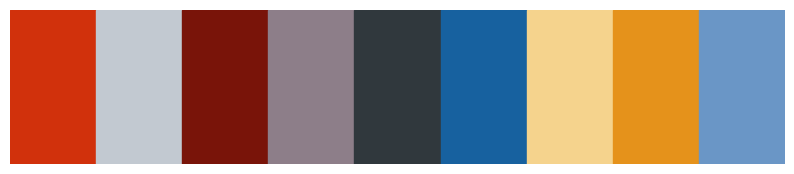

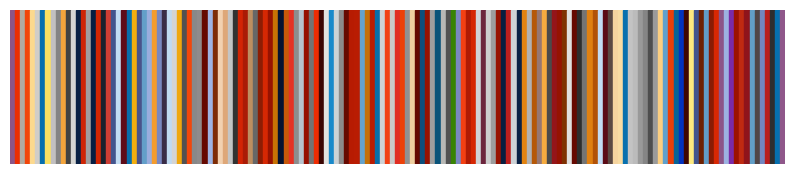

\Брендбук: 3.pdf

Цвета: ['#6e409f', '#4e4e4e', '#dabcd6', '#d04f41', '#e1e429', '#8b8387', '#e80407', '#956c88', '#372f65', '#8671d7', '#424242', '#f50203', '#88858f', '#1ae4dd', '#3d3d3d', '#aeaf58', '#cdb961', '#847d81', '#414141', '#7a6d84', '#261e2a', '#dfb5b2', '#afb056', '#eaee11', '#ec170c', '#ed2f23', '#b5aa7a', '#817081', '#8d678a', '#c4c5bc', '#ee3330', '#9b79c3', '#837489', '#8460d7', '#332c55', '#323232', '#831a13', '#cbcd4e', '#000000', '#261d2c', '#7e7e7e', '#eaed11', '#262626', '#3a3a3a', '#e9ec12', '#8d8d8d', '#dee128', '#20EAE7', '#6f409e', '#ccc978', '#ae3961', '#252122', '#ce4012', '#737373', '#e2e61c', '#291b28', '#532b94', '#7a7a7a', '#e0e0ce', '#584562', '#b2aaac', '#789cc6', '#b40b08', '#8788ae', '#837780', '#8e71ca', '#786b84', '#dcdddd', '#a12b2d', '#877c87', '#cfd018', '#373737', '#684fc0', '#7b7b7b', '#dde125', '#938598', '#635170', '#a39f98', '#cfcc37', '#525252', '#dfe621', '#efd5d0', '#807783', '#bdbe4c', '#7d7d7d', '#e2e520', '#a88da6', '#595959', '#41a7

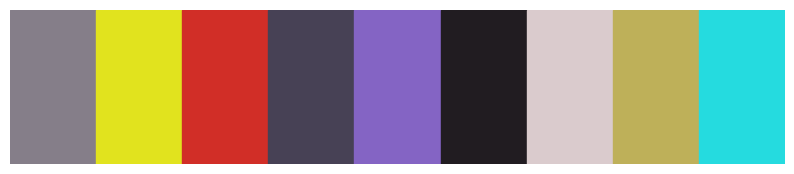

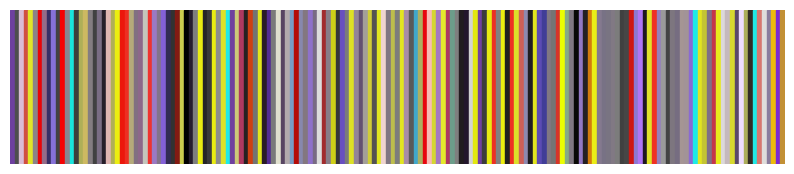

\Брендбук: 4.pdf

Цвета: ['#dadcdf', '#2b2829', '#262323', '#82998d', '#97786e', '#0b3418', '#d92821', '#d7d9d9', '#336729', '#0c7b3e', '#cfe0c4', '#82D7F5', '#b5a894', '#0f3c11', '#3e3a39', '#1e5a19', '#199242', '#926f58', '#766856', '#0d4d35', '#7b8e68', '#b7b7b6', '#386b2c', '#326426', '#adc4c5', '#3bb211', '#4e4748', '#c6bf8f', '#ae9274', '#bebab9', '#fcc343', '#a9a297', '#947041', '#cef191', '#d6d7d5', '#1e2b16', '#7caf5b', '#1e2c16', '#d6d8d8', '#c5c5c5', '#4a422d', '#d0d5da', '#4b714d', '#305e26', '#545c59', '#c26c17', '#c7c4c2', '#bcaa27', '#485328', '#8d886c', '#808c5b', '#3b5f30', '#62ae2f', '#b1aa83', '#25352f', '#33383a', '#a6a4a3', '#364334', '#38443e', '#29561f', '#cfd4da', '#2b5822', '#6b665b', '#5b8228', '#47743b', '#27521c', '#617619', '#437b34', '#00556b', '#a1a8ab', '#c7dd7e', '#95a486', '#2b2a29', '#a1591a', '#dfe2db', '#AAD296', '#336528', '#dccba6', '#75734a', '#88b420', '#373C50', '#3e7331', '#daf47a', '#818180', '#cbc8be', '#FFE6A5', '#bebfb7', '#bdb5ce', '#4144

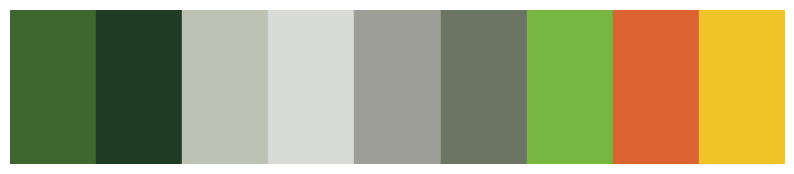

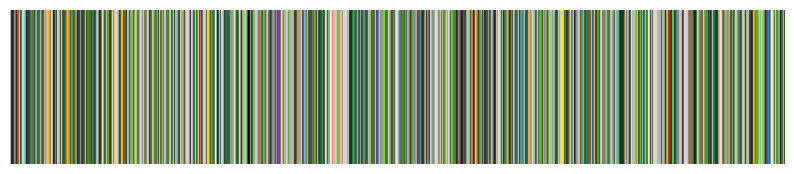

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

def show_colors(colors):
    fig, ax = plt.subplots(figsize=(10, 2))
    for i, color in enumerate(colors):
        ax.add_patch(mpatches.Rectangle((i, 0), 1, 1, color=color))
    ax.set_xlim(0, len(colors))
    ax.set_ylim(0, 1)
    ax.axis('off')
    plt.show()


for features_registry in results_features:
    print("\Брендбук:", features_registry["filename"])
    print("\nЦвета:", features_registry["colors"])
    print("\nОсновные Цвета:", features_registry["main_colors"])
    print("\nСтили:", features_registry["styles"])
    print("\nШрифты:", features_registry["fonts"])
    print("\nОграничения:", features_registry["restrictions"])
    print("\nСлоганы:", features_registry["slogans"])
    print("\nЛоготипы:", features_registry["logos"])
    show_colors(features_registry['main_colors'])
    show_colors(features_registry['colors'])



In [ ]:
print(results_features[1])

{'full_text': ' Альфа Банк\n\n2024 Новые цвета\n\nPantone 485 CU\n\nPure cyan\n\nHex #20EAE7\nВСВ 32, 234, 231\nCMYK 57, 0, 27,0\n\nWhite\nHex #090906\nКСВ 217, 217, 214\n\nCMYK 0, 0, 0, 0\n\nBlack\n\nHex\nRGB\n\n#000000\n0,0,0\nCMYK 50,50,50, 100\n\n#EF 3124\n\nHex\nRGB 239, 49, 36\nCMYK 0,100,100, 0\n\nWhite\nHex HFFFFFF\nRGB 255, 255, 255\n\nCMYK 0, 0, 0, 0 Правила\n\nСуществующая палитра сохраняется и расширяется. Основная\nлинеика — красный, черныи, и три дополнительных цвета\nбирюзовыи, фиолетовый и лимонный в меньшем соотношении.\n\nПри необходимости палитра может дополняться при условии\nОБЯЗАТЕЛЬНОГО использования минимум двух цветов из\nосновной палитры.\n\nКрасный — обязателен к использованию.\nДля создания саббрендов — брендинга сегментов и проектов для\nвнутреннего брендинга — существующая палитра расширяется. 100%-50%\nне меньше Основной градиент и цвета\n\nГрадиент состоит не более 3-х цветов, которые\nплавно переходят от тёплых к холодным\nоттенкам.\n\nГрадиент использу

## Добавление текстовых описаний

In [ ]:
# pip install translate
from translate import Translator

def translate_text(text, from_lang='en', to_lang='ru'):
    """Переводчик"""
    translator = Translator(from_lang=from_lang, to_lang=to_lang)
    try:
        translated_text = translator.translate(text)
        return translated_text
    except Exception as e:
        return f"Error: {e}"

In [ ]:
# для создания текстовых описаний к изображениям
import requests
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base").to("cuda")


# Функция генерации описания изображения
def describe_image(image_path):
    """
    image_path: путь к изображению
    Возвращает описание изображения
    """
    prompt="an image of"
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Файл не найден: {image_path}")

    raw_image = Image.open(image_path).convert('RGB')

    inputs = processor(raw_image, prompt, return_tensors="pt").to("cuda")
    out = model.generate(**inputs)
    description_en = processor.decode(out[0], skip_special_tokens=True)
    translated_text = translate_text(description_en)


    return description_en, translated_text


p:\ann\python\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
p:\ann\python\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Banan\.cache\huggingface\hub\models--Salesforce--blip-image-captioning-base. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by se

In [ ]:
import os
for item in results_features:
    filename = item["filename"]
    print(f"\nОбработка файлa: {filename}")

    descriptions_list = []

    for img_info in item["image_paths"]:
        if img_info["type"] == "page_colors_image":
            image_path = img_info["path"]

            if not os.path.exists(image_path):
                print(f"Файл не найден: {image_path}")
                continue

            try:
                description_en, description_ru = describe_image(image_path)

                # Добавляем описание
                img_info["description_en"] = description_en
                img_info["description_ru"] = description_ru
                descriptions_list.append({
                    "image_path": image_path,
                    "description_en": description_en,
                    "description_ru": description_ru
                })

                print(f"Описание создано: {description_en}")
                print(f"Описание создано: {description_ru}")

            except Exception as e:
                print(f"Ошибка при обработке {image_path}: {e}")
                img_info["description"] = "[Ошибка генерации]"

    # Сохраняем описания в отдельный файл
    with open(f"image_descriptions/{filename}_descriptions.txt", "w", encoding="utf-8") as f:
        for d in descriptions_list:
            f.write(f"{d['image_path']}\n{d['description_en']}\n{d['description_ru']}\n\n")


Обработка файлa: 2.pdf
Описание создано: an image of a red and orange floral pattern
Описание создано: изображение красно-оранжевого цветочного узора
Описание создано: an image of a building with a lot of lights
Описание создано: изображение здания с большим количеством света
Описание создано: an image of a colorful background
Описание создано: изображение красочного фона
Описание создано: an image of a building with fireworks in the background
Описание создано: изображение здания с фейерверком на заднем плане
Описание создано: an image of a room with a curtain and a table
Описание создано: изображение комнаты с занавеской и столом
Описание создано: an image of a statue of a woman holding a bowl
Описание создано: изображение статуи женщины, держащей миску
Описание создано: an image of a statue of a woman holding a book
Описание создано: изображение статуи женщины с книгой в руках
Описание создано: an image of a sound wave
Описание создано: изображение звуковой волны
Описание создано: 

In [ ]:
import json
# from google.colab import drive
# drive.mount('/content/drive')

with open("results_features.json", "w", encoding="utf-8") as f:
    json.dump(results_features, f, ensure_ascii=False, indent=4)

with open("results.json", "w", encoding="utf-8") as f:
    json.dump(results, f, ensure_ascii=False, indent=4)

In [ ]:
for key in results_features[0].keys():
    value = results_features[0][key]

    print(f"Ключ: {key}")

    # Если значение — список или строка, обрезаем до 100 символов
    if isinstance(value, (str, list)):
        preview = str(value)[:100] + ("..." if len(str(value)) > 100 else "")
    else:
        preview = value  # Для чисел и других типов — выводим как есть

    print(f"Значение: {preview}")
    print("—" * 40)

Ключ: full_text
Значение:  Руководство  
по использованию  
элементов фирменного стиля  
Большого театра
Составлено в Студии А...
————————————————————————————————————————
Ключ: colors
Значение: ['#8d5587', '#eb2e03', '#b0aaa1', '#f1450a', '#fcd98e', '#d1cdc8', '#076fae', '#fbe062', '#c2c0c0', ...
————————————————————————————————————————
Ключ: main_colors
Значение: ['#d1310c', '#8f808a', '#791409', '#c9cdd1', '#30383d', '#17619f', '#789ecd', '#f5d38d', '#e5921b']
————————————————————————————————————————
Ключ: styles
Значение: В работе всегда следует использовать только соот-
ветствующие файлы, на которые указывают ссылки, 
п...
————————————————————————————————————————
Ключ: fonts
Значение: Он известен всему миру как один 
из символов России, центр мировой музыкальной культуры, 
хранитель ...
————————————————————————————————————————
Ключ: restrictions
Значение: К руководству прилагается диск, на котором нахо-
дятся все изображения и макеты фирменного стиля
Для...
————————————————————————

# Загрузка в базу данных

In [18]:
import json
# Загрузка из файла
# with open("/content/drive/MyDrive/designers_data/results_features.json", "r", encoding="utf-8") as f:
#     results_features = json.load(f)

# # Загрузка из файла
# with open("/content/drive/MyDrive/designers_data/results.json", "r", encoding="utf-8") as f:
#     results = json.load(f)

with open("results_features.json", "r", encoding="utf-8") as f:
    results_features = json.load(f)

# Загрузка из файла
with open("results.json", "r", encoding="utf-8") as f:
    results = json.load(f)

In [19]:
results_features

[{'full_text': ' Руководство  \nпо использованию  \nэлементов фирменного стиля  \nБольшого театра\nСоставлено в\xa0Студии Артемия Лебедева в\xa02012 году Содержание\nО Большом театре\u2003\n6\nЛоготип\u2003\n7\nЗнак\u2003\n9\nБазовый логотип\u2003\n11\nПарадный логотип\u2003\n15\nТриумфальный логотип\u2003\n17\nТекстовый логотип\u2003\n18\nАнглийские логотипы\u2003\n19\nЛоготип на темном фоне\u2003\n21\nКолорированный логотип\u2003\n23\nФирменные цвета\u2003\n27\nФирменные шрифты\u2003\n29\nПолиграфия\u2003\n31\nШаблоны театральной афиши\u2003\n31\nШаблон программы спектакля\u2003\n39\nШаблон листовки-вкладыша\u2003\n47\nШаблон программы на три месяца\u2003\n51\nНомерок\u2003\n55\nДанное руководство\xa0рассказывает о визуальных \nсоставляющих фирменного стиля Большого театра \nи позволяет следить за соблюдением выработанных \nстандартов.\nК руководству прилагается диск, на котором нахо-\nдятся все изображения и\xa0макеты фирменного стиля. \nВ работе всегда следует использовать только с

In [10]:
# !pip install chromadb
# !pip install open_clip_torch
!pip install open-clip-torch

#### Первая версия базы данных

In [6]:
import os
from PIL import Image
import torch
import open_clip
import chromadb
from chromadb.utils import embedding_functions
from tqdm import tqdm

# Модель clip для эмбеддингов
clip_model, _, clip_preprocess =  open_clip.create_model_and_transforms('ViT-B-32', pretrained='laion2b_s34b_b79k')
clip_tokenizer = open_clip.get_tokenizer('ViT-B-32')

def get_image_embedding(image_path):
    """Получает эмбеддинг изображения"""
    try:
        image = clip_preprocess(Image.open(image_path)).unsqueeze(0).to("cuda" if torch.cuda.is_available() else "cpu")
        with torch.no_grad(), torch.cuda.amp.autocast():
            emb = clip_model.encode_image(image).cpu().numpy()
        return emb[0]
    except Exception as e:
        print(f"Ошибка при обработке {image_path}: {e}")
        return None

# SentenceTransformer для текстовых эмбеддингов
embedding_func = embedding_functions.SentenceTransformerEmbeddingFunction(model_name="all-MiniLM-L6-v2")

# Клиент
client = chromadb.PersistentClient(path="./chroma_db")

ModuleNotFoundError: No module named 'open_clip'

In [ ]:
def add_brandbook_data_to_chromadb(item, collection):
    """
    Добавляет элементы брендбука в соответствующую коллекцию.
    Включает: цвета, стиль, ограничения, изображения и их описания
    """
    filename = item["filename"]

    # Добавляем основные цвета
    if item.get("main_colors"):
        main_colors = ", ".join(item["main_colors"])
        collection.add(
            documents=[f"Brand Colors: {main_colors}"],
            metadatas=[{
                "source": filename,
                "type": "color"
            }],
            ids=[f"{filename}_color"]
        )

    # Стиль
    if item.get("styles"):
        collection.add(
            documents=[item["styles"]],
            metadatas=[{
                "source": filename,
                "type": "style"
            }],
            ids=[f"{filename}_style"]
        )

    # Ограничения
    if item.get("restrictions"):
        collection.add(
            documents=[item["restrictions"]],
            metadatas=[{
                "source": filename,
                "type": "restriction"
            }],
            ids=[f"{filename}_restriction"]
        )

    # Изображения
    for img_info in item.get("image_paths", []):
        image_path = img_info["path"]

        if not os.path.exists(image_path):
            print(f"[!] Файл не найден: {image_path}")
            continue

        # Получаем эмбеддинг изображения
        image_emb = get_image_embedding(image_path)
        if image_emb is None:
            continue

        # Если есть описание — используем его
        description_ru = img_info.get("description_ru", "")
        if not description_ru:
            description_ru = f"Image from {filename}, type: {img_info['type']}"

        # Добавляем в базу как документ с метаданными
        collection.add(
            embeddings=[image_emb],
            documents=[description_ru],
            metadatas=[{
                "source": filename,
                "type": "image",
                "image_path": image_path
            }],
            ids=[f"{filename}_{os.path.basename(image_path)}"]
        )

    print(f"Все данные из {filename} добавлены в {collection.name}")

INFO:backoff:Backing off send_request(...) for 1.6s (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001AFA3769450>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")))
INFO:backoff:Backing off send_request(...) for 3.2s (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001AFA3769E50>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")))


In [ ]:
def create_brand_collections(results_features):
    """
    Создаёт отдельную коллекцию в ChromaDB для каждого файла,
    'brand_1', 'brand_3'
    """
    for item in results_features:
        filename = item["filename"]
        collection_name = f"brand_{os.path.splitext(filename)[0]}"

        # Проверяем, существует ли уже такая коллекция
        try:
            collection = client.get_collection(collection_name)
            print(f"Коллекция {collection_name} уже существует")
        except:
            # Создаем новую
            collection = client.create_collection(
                name=collection_name,
                embedding_function=embedding_func,
                metadata={"hnsw:space": "cosine"}
            )
            print(f"Создана новая коллекция: {collection_name}")

        # Добавляем данные
        add_brandbook_data_to_chromadb(item, collection)

    return client

ERROR:backoff:Giving up send_request(...) after 4 tries (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001AFA376A850>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")))


In [ ]:
create_brand_collections(results_features)

### Вторая версия - на ее основе строим весь RAG

In [3]:
# !pip install --target=p:\ann\models langchain-chroma
import sys
sys.path.append(r'p:\ann\models')

In [2]:
# pip install langchain-community
# pip install langchain-chroma
# pip install loguru
# !pip install langchain-huggingface


In [32]:
import time
from langchain_huggingface import HuggingFaceEmbeddings
import torch
from loguru import logger
from langchain_chroma import Chroma
from langchain_community.vectorstores.utils import filter_complex_metadata
from collections import defaultdict
import os
import json
from langchain.text_splitter import RecursiveCharacterTextSplitter

CHUNK_SIZE = 500
CHUNK_OVERLAP = 50

def generate_chroma_dbs_by_filename(results_features, chroma_path, image_map_path="./image_maps"):
    """
    Создаёт отдельные коллекции Chroma DB по каждому уникальному filename.
    Сохраняет image_paths отдельно в JSON для последующего поиска по ним.
    """
    os.makedirs(image_map_path, exist_ok=True)
    grouped_data = defaultdict(list)

    for item in results_features:
        filename = item.get("filename", "unknown")
        grouped_data[filename].append(item)

    embeddings = HuggingFaceEmbeddings(
        model_name="sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2",
        model_kwargs={"device": "cuda" if torch.cuda.is_available() else "cpu"},
        encode_kwargs={"normalize_embeddings": True},
    )

    chroma_instances = {}

    # Инициализируем сплиттер
    text_splitter = RecursiveCharacterTextSplitter(
        chunk_size=CHUNK_SIZE,
        chunk_overlap=CHUNK_OVERLAP,
        separators=["\n\n", "\n", ".", " ", ""]
    )

    for filename, items in grouped_data.items():
        collection_name = f"brandbook__{filename.replace('.', '_')}"
        logger.info(f"Создание коллекции '{collection_name}'...")

        texts = []
        metadatas = []

        # Отдельно будем хранить image_paths по chunk_id
        image_map = {}

        global_chunk_counter = 0

        for idx, item in enumerate(items):
            full_text = item.get('full_text', '')
            chunks = text_splitter.split_text(full_text)

            for i, chunk in enumerate(chunks):
                # Формируем текст чанка + дополнительные данные
                text_for_embedding = chunk
                if item.get('colors'):
                    text_for_embedding += "\nЦвета: " + ", ".join(item['colors'])
                if item.get('main_colors'):
                    text_for_embedding += "\nОсновные цвета: " + ", ".join(item['main_colors'])
                if item.get('styles'):
                    text_for_embedding += "\nСтили: " + item['styles']
                if item.get('fonts'):
                    text_for_embedding += "\nШрифты: " + item['fonts']
                if item.get('restrictions'):
                    text_for_embedding += "\nОграничения: " + item['restrictions']

                # Метаданные
                metadata = {
                    "filename": item.get("filename"),
                    "chunk_id": i,
                    "colors": ", ".join(item.get("colors", [])),
                    "main_colors": ", ".join(item.get("main_colors", [])),
                    "styles": item.get("styles", ""),
                    "fonts": item.get("fonts", ""),
                    "restrictions": item.get("restrictions", ""),
                }

                # Добавляем image_paths в метаданные как строку
                image_paths = [img["path"] for img in item.get("image_paths", [])]
                if image_paths:
                    metadata["image_paths"] = ", ".join(image_paths)

                texts.append(text_for_embedding.strip())
                metadatas.append(metadata)

                # Сохраняем соответствие между chunk_id и image_paths
                image_map[f"{filename}_chunk_{i}"] = image_paths

            # Сохраняем image_map для текущего файла
            with open(os.path.join(image_map_path, f"{filename}.json"), "w", encoding="utf-8") as f:
                json.dump(image_map, f, ensure_ascii=False, indent=2)

        # Чистим метаданные и создаём коллекцию...

        chroma_db = Chroma.from_texts(
            texts=texts,
            embedding=embeddings,
            metadatas=metadatas,
            ids=[f"{filename}_{i}" for i in range(len(texts))],
            persist_directory=chroma_path,
            collection_name=collection_name
        )

        chroma_instances[filename] = chroma_db
        logger.info(f"Коллекция '{collection_name}' успешно создана с {len(texts)} чанками")


    return chroma_instances

In [33]:
chroma_db = generate_chroma_dbs_by_filename(
    results_features,
    # chroma_path="./chroma_db_designers"
    "./chroma_db_designers1"
)

/Users/annausova/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-06-07 21:35:55.912 | INFO     | __main__:generate_chroma_dbs_by_filename:44 - Создание коллекции 'brandbook__2_pdf'...
2025-06-07 21:36:01.117 | INFO     | __main__:generate_chroma_dbs_by_filename:110 - Коллекция 'brandbook__2_pdf' успешно создана с 154 чанками
2025-06-07 21:36:01.118 | INFO     | __main__:generate_chroma_dbs_by_filename:44 - Создание коллекции 'brandbook__3_pdf'...
2025-06-07 21:36:01.305 | INFO     | __main__:generate_chroma_dbs_by_filename:110 - Коллекция 'brandbook__3_pdf' успешно создана с 7 чанками
2025-06-07 21:36:01.306 | INFO     | __main__:generate_chroma_dbs_by_filename:44 - Создание коллекции 'brandbook__4_pdf'...
2025-06-07 21:36:06.905 | INFO     | __main__:generate_chroma_dbs_by_filename:

In [1]:
# Проверяем список коллекций
import chromadb

client = chromadb.PersistentClient(path="./chroma_db_designers1")
collections = client.list_collections()

print("Созданные коллекции:")
for col in collections:
    print(f"- {col.name} (документов: {col.count()})")


/Users/annausova/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


Созданные коллекции:
- brandbook__4_pdf (документов: 168)
- brandbook__3_pdf (документов: 7)
- brandbook__2_pdf (документов: 154)


In [26]:
pip show chromadb

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Name: chromadb
Version: 1.0.10
Summary: Chroma.
Home-page: 
Author: 
Author-email: Jeff Huber <jeff@trychroma.com>, Anton Troynikov <anton@trychroma.com>
License: 
Location: /Users/annausova/Library/Python/3.9/lib/python/site-packages
Requires: orjson, pypika, opentelemetry-instrumentation-fastapi, typing-extensions, mmh3, httpx, numpy, pyyaml, kubernetes, jsonschema, rich, grpcio, uvicorn, importlib-resources, opentelemetry-exporter-otlp-proto-grpc, tenacity, opentelemetry-api, typer, opentelemetry-sdk, posthog, tokenizers, pydantic, build, fastapi, tqdm, overrides, bcrypt, onnxruntime
Required-by: langchain-chroma
Note: you may need to restart the kernel to use updated packages.


In [10]:
# Получаем список всех коллекций
all_collections = client.list_collections()

# Удаляем все коллекции, чьи имена начинаются на brandbook__brand
for collection in all_collections:
    if collection.name.startswith("brandbook__brand"):
        try:
            client.delete_collection(name=collection.name)
            print(f"Удалена коллекция: {collection.name}")
        except Exception as e:
            print(f"Ошибка при удалении {collection.name}: {e}")

Удалена коллекция: brandbook__brand_3_pdf


In [14]:
results_features[2].get('image_paths')

[{'path': 'brandbook_images/4/page1_img0.png',
  'type': 'page_colors_image',
  'description_en': 'an image of a green background',
  'description_ru': 'изображение зеленого фона'},
 {'path': 'brandbook_images/4/page4_img0.png',
  'type': 'page_colors_image',
  'description_en': 'an image of a girl in a field',
  'description_ru': 'изображение девушки в поле'},
 {'path': 'brandbook_images/4/page5_img0.png',
  'type': 'page_colors_image',
  'description_en': 'an image of a white wall with a shadow',
  'description_ru': 'изображение белой стены с тенью'},
 {'path': 'brandbook_images/4/page12_img0.png',
  'type': 'page_colors_image',
  'description_en': 'an image of pears in baskets',
  'description_ru': 'изображение груш в корзинах'},
 {'path': 'brandbook_images/4/page12_img1.png',
  'type': 'page_colors_image',
  'description_en': 'an image of a white background with wavy lines',
  'description_ru': 'изображение белого фона с волнистыми линиями'},
 {'path': 'brandbook_images/4/page12_im

In [2]:
from langchain_chroma import Chroma
from langchain_huggingface import HuggingFaceEmbeddings
from loguru import logger

def connect_to_chroma_collection(filename, chroma_path="./chroma_db_designers1"):
    """
    Подключается к конкретной коллекции Chroma по имени файла.

    :param filename: имя исходного файла - '2.pdf'
    :param chroma_path: путь к сохранённой базе
    :return: экземпляр Chroma для указанной коллекции
    """
    try:
        # Преобразуем имя файла в имя коллекции (заменяем '.' на '_')
        collection_name = f"brandbook__{filename.replace('.', '_')}"

        logger.info(f"Загрузка модели эмбеддингов...")
        embeddings = HuggingFaceEmbeddings(
            model_name="sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2",
            model_kwargs={"device": "cuda" if torch.cuda.is_available() else "cpu"},
            encode_kwargs={"normalize_embeddings": True},
        )

        logger.info(f"Подключение к коллекции '{collection_name}'...")
        chroma_db = Chroma(
            persist_directory=chroma_path,
            embedding_function=embeddings,
            collection_name=collection_name
        )

        logger.info(f"Успешное подключение к коллекции: {collection_name}")
        return chroma_db

    except Exception as e:
        logger.error(f"Ошибка подключения к коллекции {collection_name}: {e}")
        raise

In [13]:
import os
os.environ["CHROMA_TELEMETRY"] = "false" # попытка отключить WARNINGы

# RAG-pipeline
тестируем два сценаярия:
- только текстовые данные
- текст + изображения из брендбука

In [12]:
import torch

db_3 = connect_to_chroma_collection("3.pdf")

results = db_3.similarity_search("реклама дебетовых карт", k=1)
for doc in results:
    print(doc.page_content)
    print(doc.metadata)

2025-06-08 12:39:48.677 | INFO     | __main__:connect_to_chroma_collection:17 - Загрузка модели эмбеддингов...
2025-06-08 12:39:54.035 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-08 12:39:54.043 | INFO     | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf


чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6, #b40b08, #8788ae, #837780, #8e71ca, #786b84, #dcdddd, #a12b2d, #877c87, #cfd018, #373737, #684fc0, #7b7b7b, #dde125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #807783, #bdbe4c, #7d7d7d, #e2e520, #a88da6, #595959, #41a7ca, #aea

### 1. Retrieval - поиск и извлечение релевантной информации

In [3]:
from typing import List, Dict, Optional
from loguru import logger

def search_in_collection(
    query: str,
    filename: str,
    metadata_filter: Optional[Dict] = None,
    k: int = 4
) -> List[Dict]:
    """
    Выполняет поиск в указанной коллекции Chroma с поддержкой фильтрации по chunk_id.

    Args:
        query (str): Текстовый запрос для поиска
        filename (str): Имя файла, на основе которого создана коллекция (например '2.pdf')
        metadata_filter (dict, optional): Фильтр по метаданным (например {'colors': '#d12e27'})
        k (int): Количество результатов для возврата

    Returns:
        list: Список найденных документов с текстом, метаданными, оценкой и путями к изображениям
    """
    try:
        chroma_db = connect_to_chroma_collection(filename=filename)

        # Если фильтр пустой — передаём None
        final_filter = metadata_filter if metadata_filter else None

        results = chroma_db.similarity_search_with_score(query, k=k, filter=final_filter)
        logger.info(f"Найдено {len(results)} результатов для запроса '{query}' в файле '{filename}'")

        formatted_results = []
        for doc, score in results:
            result_item = {
                "text": doc.page_content,
                "metadata": doc.metadata,
                "similarity_score": round(score, 4),
                "images": doc.metadata.get("image_paths", [])
            }
            formatted_results.append(result_item)

        return formatted_results

    except Exception as e:
        logger.error(f"Ошибка при поиске в коллекции '{filename}': {e}")
        raise

In [6]:
import os
from IPython.display import display, Image


def display_images_from_results(results, image_base_dir=None):
    """
    Отображает изображения из результатов поиска.

    :param results: Результаты поиска (список dict с ключом "images")
    :param image_base_dir: Базовая директория, если изображения лежат в подпапках
    """
    seen = set()
    for res in results:
        images = res.get("images", [])
        for path in images:
            full_path = os.path.join(image_base_dir, path) if image_base_dir else path
            if full_path not in seen and os.path.exists(full_path):
                logger.info(f"Отображение изображения: {full_path}")
                display(Image(filename=full_path))
                seen.add(full_path)

In [39]:
metadata_filter= {'main_colors': '#20EAE7'}

for i in search_in_collection(query="какие основные цвета?", filename='3.pdf'):
    print(i)

results = search_in_collection(
    query="цветовая палитра",
    filename='3.pdf',
    metadata_filter={"colors": "#eb2e03"}
)

# С фильтром — тоже окей
for i in results:
    print(i)

display_images_from_results(results)
print('-A'*40)

for i in search_in_collection(query="какие основные цвета?", filename='3.pdf'):
    print(i['text'])
    print(i['metadata'])
    print("Изображения:", i['images'])
    print("-" * 50)

2025-06-07 21:37:18.995 | INFO     | __main__:connect_to_chroma_collection:17 - Загрузка модели эмбеддингов...
2025-06-07 21:37:21.941 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-07 21:37:21.946 | INFO     | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf
2025-06-07 21:37:21.977 | INFO     | __main__:search_in_collection:29 - Найдено 4 результатов для запроса 'какие основные цвета?' в файле '3.pdf'
2025-06-07 21:37:21.978 | INFO     | __main__:connect_to_chroma_collection:17 - Загрузка модели эмбеддингов...


{'text': 'При необходимости палитра может дополняться при условии\nОБЯЗАТЕЛЬНОГО использования минимум двух цветов из\nосновной палитры.\n\nКрасный — обязателен к использованию.\nДля создания саббрендов — брендинга сегментов и проектов для\nвнутреннего брендинга — существующая палитра расширяется. 100%-50%\nне меньше Основной градиент и цвета\n\nГрадиент состоит не более 3-х цветов, которые\nплавно переходят от тёплых к холодным\nоттенкам.\n\nГрадиент используется, чтобы добавить\n\nакцентов. 7\nЦвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61

2025-06-07 21:37:25.378 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-07 21:37:25.383 | INFO     | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf
2025-06-07 21:37:25.416 | INFO     | __main__:search_in_collection:29 - Найдено 0 результатов для запроса 'цветовая палитра' в файле '3.pdf'
2025-06-07 21:37:25.417 | INFO     | __main__:connect_to_chroma_collection:17 - Загрузка модели эмбеддингов...


-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A-A


2025-06-07 21:37:28.854 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-07 21:37:28.857 | INFO     | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf
2025-06-07 21:37:28.890 | INFO     | __main__:search_in_collection:29 - Найдено 4 результатов для запроса 'какие основные цвета?' в файле '3.pdf'


При необходимости палитра может дополняться при условии
ОБЯЗАТЕЛЬНОГО использования минимум двух цветов из
основной палитры.

Красный — обязателен к использованию.
Для создания саббрендов — брендинга сегментов и проектов для
внутреннего брендинга — существующая палитра расширяется. 100%-50%
не меньше Основной градиент и цвета

Градиент состоит не более 3-х цветов, которые
плавно переходят от тёплых к холодным
оттенкам.

Градиент используется, чтобы добавить

акцентов. 7
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a

#### Функции поиска для старой хромы

In [ ]:
# Функции поиска
# По тексту
def search_by_text(query, brand_collection_name, top_k=3):
    collection = client.get_collection(brand_collection_name)
    results = collection.query(
        query_texts=[query],
        n_results=top_k
    )

    return [
        {
            "id": results["ids"][0][i],
            "document": results["documents"][0][i],
            "metadata": results["metadatas"][0][i]
        }
        for i in range(len(results["ids"][0]))
    ]

# По изображению
def search_by_image(image_path, brand_collection_name, top_k=3):
    image_emb = get_image_embedding(image_path)
    collection = client.get_collection(brand_collection_name)

    results = collection.query(
        query_embeddings=[image_emb],
        n_results=top_k
    )

    return [
        {
            "id": results["ids"][0][i],
            "document": results["documents"][0][i],
            "metadata": results["metadatas"][0][i]
        }
        for i in range(len(results["ids"][0]))
    ]

In [ ]:
search_by_text('Реклама дебетовых карт', brand_collection_name='brand_3')

[{'id': '3.pdf_restriction',
  'document': 'Красный — обязателен к использованию\nДля создания саббрендов — брендинга сегментов и проектов для\nвнутреннего брендинга — существующая палитра расширяется',
  'metadata': {'type': 'restriction', 'source': '3.pdf'}},
 {'id': '3.pdf_style',
  'document': 'Градиент используется, чтобы добавить\n\nакцентов\nПри использовании нескольких \nсимволов в одном макете они\nдолжны быть одинаковые\nпо толщине линий\nАлфавит дополнительных\nэлементов\nДополнительные 2D элементы стиля\nВ рамках одного текстового блока \nдопускается использование нескольких символов на выбор дизайнера Алфавит дополнительных\nэлементов\nВыделение зоны остается основным инструментом фирменного стиля',
  'metadata': {'source': '3.pdf', 'type': 'style'}},
 {'id': '3.pdf_color',
  'document': 'Brand Colors: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf',
  'metadata': {'source': '3.pdf', 'type': 'color'}}]

базовый пайплан - тест для pdf.3

#### Настройка для локальной работы
p.s. были проблемы с местами на диске

In [46]:
os.environ["HF_HOME"] = "D:/models/huggingface"
os.environ["HUGGINGFACE_HUB_CACHE"] = "D:/models/huggingface/hub"

In [ ]:
import importlib.metadata
import os
import shutil

try:
    version = importlib.metadata.version('langchain-huggingface')
    print(f"langchain-huggingface установлена (версия {version})")
except importlib.metadata.PackageNotFoundError:
    print("langchain-huggingface не найдена")

cache_dir = os.path.expanduser("~/.cache/huggingface/hub")
if os.path.exists(cache_dir):
    print("Сохранённые модели:")
    for folder in os.listdir(cache_dir):
        print(" -", folder)
else:
    print("Кэш пока пуст.")

print(cache_dir)

hf_cache = os.getenv("HF_HOME", os.path.expanduser("~/.cache/huggingface/hub"))
print(f"Модели сохраняются в: {hf_cache}")

NEW_HF_CACHE = r"D:\huggingface\hub"
OLD_HF_CACHE = r"C:\Users\Banan\.cache\huggingface\hub"

# Установка нового кэша
os.environ["HF_HOME"] = r"D:\huggingface"
os.environ["HUGGINGFACE_HUB_CACHE"] = NEW_HF_CACHE

# Перенос, если старый кэш существует
if os.path.exists(OLD_HF_CACHE) and not os.path.exists(NEW_HF_CACHE):
    print("Переношу модели в новую папку...")
    # shutil.copytree(OLD_HF_CACHE, NEW_HF_CACHE, dirs_exist_ok=True)
    # print("Модели перенесены в", NEW_HF_CACHE)

# Проверка
print("\nТеперь модели будут использоваться из:")
print(os.getenv("HUGGINGFACE_HUB_CACHE"))

langchain-huggingface установлена (версия 0.2.0)
Кэш пока пуст.
C:\Users\Banan/.cache/huggingface/hub
Модели сохраняются в: D:/huggingface

Теперь модели будут использоваться из:
D:\huggingface\hub


In [45]:
import os

# Проверяем текущий путь к кэшу
print("Текущий путь к кэшу:")
print(os.getenv("HF_HOME", "~/.cache/huggingface/hub"))

# Устанавливаем новый путь
os.environ["HF_HOME"] = "D:/huggingface"
os.environ["HUGGINGFACE_HUB_CACHE"] = "D:/huggingface/hub"

print("\nНовый путь к кэшу:")
print(os.getenv("HF_HOME"))

Текущий путь к кэшу:
D:/models/huggingface

Новый путь к кэшу:
D:/huggingface


In [ ]:
from transformers import AutoModelForCausalLM, AutoTokenizer
# куда будут скачаны модели
os.environ["HF_HOME"] = r"D:\huggingface"
os.environ["HUGGINGFACE_HUB_CACHE"] = r"D:\huggingface\hub"

model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"

tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

print("Модель загружена и сохранена в новое место")

p:\ann\python\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in D:\huggingface\models\models--TinyLlama--TinyLlama-1.1B-Chat-v1.0. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


Модель загружена и сохранена в новое место


In [ ]:
from transformers import AutoTokenizer, AutoModelForCausalLM
import sys
sys.path.append(r'D:\huggingface')

save_path = r"D:\huggingface\models\qwen\Qwen2-1.5B-Instruct"

model_name = "Qwen/Qwen2-1.5B-Instruct"

print("Загрузка модели...")
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Сохраняем на нужный диск
print(f"Сохранение модели в {save_path}...")
model.save_pretrained(save_path)
tokenizer.save_pretrained(save_path)

print("Модель успешно сохранена!")

Загрузка модели...


p:\ann\python\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in D:\huggingface\models\models--Qwen--Qwen2-1.5B-Instruct. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, in

Сохранение модели в D:\huggingface\models\qwen\Qwen2-1.5B-Instruct...
Модель успешно сохранена!


### 2.0 Augmented — дополнение запроса. Выбор модели для преобразования промпта

In [9]:
# pip install mlx
# pip install mlx-lm

In [30]:
from mlx_lm import load, generate

model, tokenizer = load("mlx-community/DeepSeek-R1-0528-Qwen3-8B-4bit-DWQ")


prompt = """[INST] You are a strict assistant that creates designer specifications based on brand guidelines.
Generate output in the exact format below, no additional text:
[HEADER]:
[COLORS]:
[STYLE]:
[RESTRICTIONS]:
Context:
---
ЗА
СЕБЯ Базовый набор элементов
Базовые 2D элементы стиля.
При использовании нескольких 
символов в одном макете они
должны быть одинаковые
по толщине линий. Алфавит дополнительных
элементов
Дополнительные 2D элементы стиля. В рамках одного текстового блока 
допускается использование нескольких символов на выбор дизайнера Алфавит дополнительных
элементов
Выделение зоны остается основным инструментом фирменного стиля. В зависимости от
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6, #b40b08, #8788ae, #837780, #8e71ca, #786b84, #dcdddd, #a12b2d, #877c87, #cfd018, #373737, #684fc0, #7b7b7b, #dde125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #807783, #bdbe4c, #7d7d7d, #e2e520, #a88da6, #595959, #41a7ca, #aeaf61, #e7060e, #f9bab5, #d4d631, #a578c1, #e4e92c, #ae3861, #6c9d8a, #7f7f7f, #211c1f, #23162c, #d3d3d3, #e2e710, #7040A0, #3c3c3c, #e7ea13, #ed3023, #808080, #ecee0f, #202020, #ee3023, #dcdf29, #ce5f57, #8e89af, #201d21, #e1e51e, #5b4bb3, #413d97, #807782, #747474, #d5342a, #ebfe00, #85ab85, #817882, #090906, #9378c3, #241f24, #d37b0d, #e9ed17, #84798e, #787285, #797482, #817984, #7c7c7c, #404040, #464646, #cd1713, #8d78d0, #af76f4, #1e1622, #e0e22b, #EF3124, #9480bc, #9a9a9a, #434343, #7d767f, #766d81, #a59594, #a29397, #896ad4, #1ee9e6, #e1e421, #c3c433, #7e6f87, #c4354b, #e7e91d, #dcd9d9, #c5b9bd, #d7d92e, #5a4869, #EDF, #acad5c, #322b26, #1fe9e6, #d7776f, #dfdddb, #8a7d9e, #edbb0b, #7a2bd3, #c29035
Основные цвета: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
Стили: Градиент используется, чтобы добавить

акцентов
При использовании нескольких 

---
Initial task: дизайн дебетовой карты для рекламы
"""

# Красный (#d12e27) — обязателен к использованию
# Для создания саббрендов существующая палитра расширяется
# Градиент используется для акцентов
# Символы в одном макете должны быть одинаковой толщины
# Используются дополнительные 2D элементы стиля
# Выделение зоны — основной инструмент фирменного стиля
# Фирменные цвета:
# #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
# if tokenizer.chat_template is not None:
#     messages = [{"role": "user", "content": prompt}]
#     prompt = tokenizer.apply_chat_template(messages, add_generation_prompt=True)
# else:
#     prompt = prompt 

response = generate(model, tokenizer, prompt=prompt, verbose=True)


Fetching 6 files: 100%|██████████| 6/6 [00:00<00:00, 76029.68it/s]


---
Output format:
[HEADER]:
[COLORS]:
[STYLE]:
[RESTRICTIONS]:
---
[/INST]
[HEADER]:
Дизайн дебетовой карты для рекламного материала
[COLORS]:
Основные цвета: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
Дополнительные цвета из палитры: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #8
Prompt: 1562 tokens, 143.426 tokens-per-sec
Generation: 256 tokens, 24.903 tokens-per-sec
Peak memory: 13.899 GB


In [18]:
response

'[STYLE]: ...\n[RESTRICTIONS]: ...\n[/INST]\n[HEADER]: Debit Card Advertisement\n[COLORS]: Primary: #d12e27 (red) — mandatory, gradient accents, additional 2D elements, use of supplementary colors from the palette including #857e89, #e0e21e, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf\n[STYLE]: Modern and sleek design with gradient accents and 2D elements, incorporating the brand colors and symbols with consistent thickness, emphasizing the main color for the header and key elements.\n[RESTRICTIONS]: Must include the red color (#d12e27) prominently, use gradient for accents, maintain symbol thickness consistency, incorporate additional 2D elements, and adhere to the specified color palette. The design must be for a debit card advertisement, ensuring clarity and appeal. [/INST]\n[HEADER]: Debit Card Advertisement\n[COLORS]: Primary: #d12e27 (red) — mandatory, gradient accents, additional 2D elements, use of supplementary colors from the palette'

In [42]:
device = (
    "cuda" if torch.cuda.is_available() 
    else "mps" if getattr(torch.backends, "mps", False) and torch.backends.mps.is_available() 
    else "cpu"
)
print("Используем", device)



Используем mps


In [43]:
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch
# проверка адекватности запроса - похоже на правду - используем Qwen
# Загрузка модели и токенизатора
model_name = "Qwen/Qwen2-1.5B-Instruct"

tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name).to(device)

prompt = """You are the assistant for the improvement of designers' products. 
Based on the context, create a detailed product for the designer.

Context:
---
Красный (#d12e27) — обязателен к использованию
Для создания саббрендов существующая палитра расширяется
Градиент используется для акцентов
Символы в одном макете должны быть одинаковой толщины
Используются дополнительные 2D элементы стиля
Выделение зоны — основной инструмент фирменного стиля

Фирменные цвета:
#857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf

---

The user's initial prompt:
"Create an advertisement for debit cards"

Specify the promptness by adding:
[COLORS] — use a branded palette, especially red
[STYLE] — graphic elements, line thickness, 2D style
[RESTRICTIONS] — prohibits the use of third-party styles and colors
[FONT] — specify a standard uncut font, such as Roboto or Open Sans
[HEADING] — should be the central element
Write all the answers in English.

Output example:
[HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
"""

messages = [
    {"role": "system", "content": "Ты — помощник по улучшению промптов дизайнеров."},
    {"role": "user", "content": prompt}
]

formatted_prompt = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

inputs = tokenizer(formatted_prompt, return_tensors="pt").to(model.device)

# Генерация
outputs = model.generate(
    **inputs,
    max_new_tokens=500,
    do_sample=True,
    temperature=0.3,
    top_p=0.9,
    eos_token_id=tokenizer.eos_token_id,
    pad_token_id=tokenizer.pad_token_id
)

response = tokenizer.decode(outputs[0][len(inputs["input_ids"][0]):], skip_special_tokens=True)
print("Ответ:", response.strip())

: 

In [1]:
from transformers import AutoTokenizer, AutoModelForCausalLM
import torch
device = (
    "cuda" if torch.cuda.is_available() 
    else "mps" if getattr(torch.backends, "mps", False) and torch.backends.mps.is_available() 
    else "cpu"
)
print("Используем", device)
# 2 проверка адекватности запроса - чушь
model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

# Пример запроса
prompt = """You are the assistant for the improvement of designers' products. 
Based on the context, create a detailed product for the designer.

Context:
---
Красный (#d12e27) — обязателен к использованию
Для создания саббрендов существующая палитра расширяется
Градиент используется для акцентов
Символы в одном макете должны быть одинаковой толщины
Используются дополнительные 2D элементы стиля
Выделение зоны — основной инструмент фирменного стиля

Фирменные цвета:
#857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf

---

The user's initial prompt:
"Create an advertisement for debit cards"

Specify the promptness by adding:
[COLORS] — use a branded palette, especially red
[STYLE] — graphic elements, line thickness, 2D style
[RESTRICTIONS] — prohibits the use of third-party styles and colors
[FONT] — specify a standard uncut font, such as Roboto or Open Sans
[HEADING] — should be the central element
Write all the answers in English.

Output example:
[HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
"""
messages = [
    {"role": "user", "content": prompt}
]

formatted_prompt = tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

inputs = tokenizer(formatted_prompt, return_tensors="pt").to(model.device)

outputs = model.generate(
    **inputs,
    max_new_tokens=300,
    do_sample=True,
    temperature=0.5,
    top_p=0.95,
    eos_token_id=tokenizer.eos_token_id,
    pad_token_id=tokenizer.pad_token_id
)
response = tokenizer.decode(outputs[0][len(inputs["input_ids"][0]):], skip_special_tokens=True)

print("Ответ:", response)

/Users/annausova/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/annausova/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Используем mps
Ответ: Product Name: Debit Card Advertisement

Product Description:

Our branded debit card advertisement is a bold and eye-catching design that stands out in the crowded marketplace. The use of red accent colors and a graphic element in a bold, oversized font create a visually striking and memorable design that will capture the attention of potential customers.

The main message of the advertisement is to highlight the convenience and safety of using debit cards, with a focus on the ease of use and quick access to funds. The use of a standard uncut font, such as Roboto or Open Sans, ensures that the advertisement is readable and legible on a variety of screens.

To ensure that the advertisement is optimized for mobile devices, we have included a responsive design that adapts to different screen sizes. The use of a gradient background color allows for a seamless transition between the different design elements, making the advertisement look polished and professional.

Fu

### 2. Augmented - дополнение запроса

#### 1 попытка

In [ ]:
from langchain_huggingface import HuggingFacePipeline
from transformers import pipeline
import torch
import os

if torch.cuda.is_available():
    print("Используем GPU")
    hf_pipeline = pipeline(
        "text-generation",
        model="TinyLlama/TinyLlama-1.1B-Chat-v1.0",
        model_kwargs={"torch_dtype": torch.float16},
        max_new_tokens=100,
        device_map="auto"
    )
else:
    print("Используем CPU")
    hf_pipeline = pipeline(
        "text-generation",
        model="TinyLlama/TinyLlama-1.1B-Chat-v1.0",
        max_new_tokens=100
    )


# указываем путь к кэшу моделей (мои проблемы при развертывании)
os.environ["HF_HOME"] = "D:/huggingface"
os.environ["HUGGINGFACE_HUB_CACHE"] = "D:/huggingface/hub"

# if torch.cuda.is_available():
#     print("Используем GPU")
#     hf_pipeline = pipeline(
#         "text-generation",
#         model="Qwen/Qwen2-1.5B-Instruct",
#         model_kwargs={
#             "torch_dtype": torch.float16,
#             "cache_dir": os.getenv("HUGGINGFACE_HUB_CACHE")
#         },
#         max_new_tokens=100,
#         device_map="auto"
#     )
# else:
#     print("Используем CPU")
#     hf_pipeline = pipeline(
#         "text-generation",
#         model="Qwen/Qwen2-1.5B-Instruct",
#         model_kwargs={
#             "cache_dir": os.getenv("HUGGINGFACE_HUB_CACHE")
#         },
#         max_new_tokens=100
#     )


# import os
# import torch
# from transformers import pipeline, AutoTokenizer, AutoModelForCausalLM, PreTrainedTokenizer
# from langchain_huggingface import HuggingFacePipeline
# from loguru import logger

# if torch.cuda.is_available():
#     print("Используем GPU")

#     model_name = "Qwen/Qwen2-1.5B-Instruct"
#     tokenizer = AutoTokenizer.from_pretrained(model_name)

#     model = AutoModelForCausalLM.from_pretrained(
#         model_name,
#         torch_dtype=torch.float16,
#         cache_dir=os.getenv("HUGGINGFACE_HUB_CACHE"),
#         device_map="auto"
#     )

#     # Функция для обработки входных данных
#     def format_messages(prompt):
#         messages = [
#             {"role": "system", "content": "You are a designer assistant that follows brandbook guidelines."},
#             {"role": "user", "content": prompt}
#         ]
#         return tokenizer.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)

#     # Кастомный преобразователь текста
#     def preprocess_function(prompt_text):
#         formatted_text = format_messages(prompt_text)
#         inputs = tokenizer(formatted_text, return_tensors="pt").to(model.device)
#         return inputs

#     # Обёртка над generate для pipeline
#     from transformers.pipelines.pt_utils import PipelineDataset
#     from torch.utils.data import DataLoader

#     class CustomTextGenerationPipeline:
#         def __init__(self, model, tokenizer):
#             self.model = model
#             self.tokenizer = tokenizer

#         def __call__(self, prompt_list, **kwargs):
#             results = []
#             for prompt in prompt_list:
#                 formatted_prompt = format_messages(prompt["text"])
#                 inputs = tokenizer(formatted_prompt, return_tensors="pt").to(model.device)

#                 with torch.no_grad():
#                     outputs = self.model.generate(
#                         **inputs,
#                         max_new_tokens=500,
#                         do_sample=True,
#                         temperature=0.3,
#                         top_p=0.9,
#                         eos_token_id=self.tokenizer.eos_token_id,
#                         pad_token_id=self.tokenizer.pad_token_id
#                     )

#                 response = self.tokenizer.decode(outputs[0][len(inputs["input_ids"][0]):], skip_special_tokens=True)
#                 results.append({"generated_text": response})
#             return results


#     # Создаём кастомную пайплайн-обёртку
#     custom_pipeline = CustomTextGenerationPipeline(model=model, tokenizer=tokenizer)

#     # Делаем из неё LLM для LangChain
#     llm = HuggingFacePipeline(pipeline=custom_pipeline)

# else:
#     print("Используем CPU")
#     hf_pipeline = pipeline(
#         "text-generation",
#         model="Qwen/Qwen2-1.5B-Instruct",
#         model_kwargs={
#             "cache_dir": os.getenv("HUGGINGFACE_HUB_CACHE")
#         },
#         max_new_tokens=100
#     )
#     llm = HuggingFacePipeline(pipeline=hf_pipeline)

Используем GPU


Device set to use cuda:0


#### 2 попытка

In [ ]:
# попытка 2 с лламой
import torch
from transformers import AutoTokenizer, AutoModelForCausalLM
from langchain_huggingface import HuggingFacePipeline
from loguru import logger
from typing import List, Dict, Any

model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
tokenizer = AutoTokenizer.from_pretrained(model_name)

if torch.cuda.is_available():
    print("Используем GPU")
    model = AutoModelForCausalLM.from_pretrained(
        model_name,
        torch_dtype=torch.float16,
        device_map="auto"
    )
else:
    print("Используем CPU")
    model = AutoModelForCausalLM.from_pretrained(model_name)

# Кастомный класс-обёртка для pipeline
class CustomTextGenerationPipeline:
    def __init__(self, model, tokenizer):
        self.model = model
        self.tokenizer = tokenizer

    def __call__(self, inputs: List[Dict[str, str]], **kwargs) -> List[Dict[str, str]]:
        results = []
        for item in inputs:
            prompt = item["text"]
            
            # Применяем chat template
            messages = [{"role": "user", "content": prompt}]
            formatted_prompt = self.tokenizer.apply_chat_template(
                messages,
                tokenize=False,
                add_generation_prompt=True
            )

            # Токенизируем
            inputs_tensor = self.tokenizer(formatted_prompt, return_tensors="pt").to(self.model.device)

            # Генерация
            with torch.no_grad():
                outputs = self.model.generate(
                    **inputs_tensor,
                    max_new_tokens=300,
                    do_sample=True,
                    temperature=0.5,
                    top_p=0.95,
                    eos_token_id=self.tokenizer.eos_token_id,
                    pad_token_id=self.tokenizer.pad_token_id
                )

            # Декодирование только нового текста
            response = self.tokenizer.decode(outputs[0][len(inputs_tensor["input_ids"][0]):], skip_special_tokens=True)
            results.append({"generated_text": response})
        
        return results

# Создаём кастомный pipeline
custom_pipeline = CustomTextGenerationPipeline(model=model, tokenizer=tokenizer)


llm = HuggingFacePipeline(pipeline=custom_pipeline)

Используем GPU


In [ ]:
model_name = "TinyLlama/TinyLlama-1.1B-Chat-v1.0"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForCausalLM.from_pretrained(model_name)

hf_pipeline = pipeline(
    "text-generation",
    model=model,
    tokenizer=tokenizer,
    max_new_tokens=300,
    do_sample=True,
    temperature=0.5,
    top_p=0.95,
    eos_token_id=tokenizer.eos_token_id,
    pad_token_id=tokenizer.pad_token_id
)
llm = HuggingFacePipeline(pipeline=hf_pipeline)

#### 3 попытка - ok на винде

In [13]:
from transformers import AutoTokenizer, AutoModelForCausalLM, pipeline
from langchain_community.llms import HuggingFacePipeline
import torch
import os
import logging

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

device = (
    "cuda" if torch.cuda.is_available() 
    else "mps" if getattr(torch.backends, "mps", False) and torch.backends.mps.is_available() 
    else "cpu"
)
print("Используем", device)

model_name = "Qwen/Qwen2-1.5B-Instruct"

tokenizer = AutoTokenizer.from_pretrained(model_name)

model = AutoModelForCausalLM.from_pretrained(
    model_name,
    torch_dtype=torch.float16 if device == "cuda" else torch.float32,
    cache_dir=os.getenv("HUGGINGFACE_HUB_CACHE")
).to(device)

# Создаём пайплайн text-generation
hf_pipeline = pipeline(
    "text-generation",
    model=model,
    tokenizer=tokenizer,
    max_new_tokens=500,
    do_sample=True,
    temperature=0.3,
    top_p=0.9,
    eos_token_id=tokenizer.eos_token_id,
    pad_token_id=tokenizer.pad_token_id,
    device=0 if device == "cuda" else -1
)

# Оборачиваем в HuggingFacePipeline из LangChain
llm = HuggingFacePipeline(pipeline=hf_pipeline)

Используем GPU


p:\ann\python\Lib\site-packages\huggingface_hub\file_download.py:143: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in D:\models\huggingface\hub\models--Qwen--Qwen2-1.5B-Instruct. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)
Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance

In [14]:
# Функция уточнения промпта через RAG

def enhance_prompt_with_rag(prompt, brand_collection_name):
    """
    Находит релевантные данные из брендбука и уточняет промпт
    """
    logger.info(f'Получен исходный промпт: {prompt}')
    logger.info(f'Поиск в коллекции: {brand_collection_name}')
    # context_list = search_by_text(prompt, brand_collection_name) # старая хрома
    context_list = search_in_collection(prompt, brand_collection_name, k=1)

    # Собираем контекст из найденных данных
    if context_list:
        context_str = "\n".join([ctx.get("text", "") for ctx in context_list])
        logger.info(f"Найденный контекст:\n{context_str}")
    else:
        context_str = ""
        logger.warning("Контекст не найден")

    system_prompt = f"""
You are the assistant for the improvement of designers' products. 
Based on the context, create a detailed product for the designer.
Context:
---
{context_str}
---
The user's initial prompt:
---
"{prompt}"
---
Specify the promptness by adding:
- The brand's signature colors
- Style and graphic elements
- Font and text size
- Usage restrictions
Write all the answers in English.
Output example:
[HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
"""

    logger.info("Формирование системного промпта завершено")
    try:
        response = llm.invoke(system_prompt)
        full_response = response.strip()
        logger.info(f"Результат:\n{full_response}")

        # Ищем начало нужного блока
        output_start = full_response.find("[HEADER]:")
        if output_start == -1:
            logger.warning("Не найдено начало ожидаемого формата ответа.")
            return full_response  # если не найдено — возвращаем как есть

        cleaned_response = full_response[output_start:]
        logger.info(f"Очищенный результат:\n{cleaned_response}")
        return cleaned_response

    except Exception as e:
        logger.error(f"Ошибка при вызове LLM: {e}")
        raise

In [37]:
print(res)

[HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Debit Card"

[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"

[STYLE]: "Graffiti style with bold typography and geometric shapes."

[RESTRICTIONS]: "Red is mandatory for branding."

[TEXT]: "Welcome to your new Debit Card! This card offers you convenience and security. With our debit card, you can easily make purchases without worrying about credit limits or high interest rates. Enjoy the freedom of spending money as you please, knowing that every transaction is safe and secure. Get yours today and start enjoying the benefits of banking at its best!"

[HEADER]: "BANKING CARD"

[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"

[STYLE]: "Minimalist design with clean lines and simple typography."

[RESTRICTIONS]: "Green is mandatory for branding."

[TEXT]: "Unlock the power of banking wit

In [15]:
res = enhance_prompt_with_rag("Дебетовая карта", "3.pdf")
print(res)

INFO:__main__:Получен исходный промпт: Дебетовая карта
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2
INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Дебетовая карта' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9

[HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Debit Card"

[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"

[STYLE]: "Gradient is used to add accents."

[RESTRICTIONS]: "Red color must be used."

[TEXT]: "Please note that this card offers a variety of features including balance tracking, transaction history, and easy access to your funds. It also includes a secure payment system with advanced fraud protection measures. With this debit card, you can enjoy peace of mind when making purchases or paying bills online or offline. Whether you're shopping online, dining out, or paying for services, our debit card provides a convenient and reliable way to manage your finances. Stay connected with us for more information about how we can help you achieve financial freedom."


In [ ]:
search_in_collection("Дебетовая карта", "3.pdf", k=1)

INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2
INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Дебетовая карта' в файле '3.pdf'


[{'text': 'чтобы первый и последний цвет не выходили за края\nи не терялись из общего градиента Б Альфа Банк\n\nПревращайте\n\nв рассрочку ранее\nсделанные покупки\nи пользуйтесь\nденьгами ещё раз ГОЛОСУЙТЕ\nЦвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6, #b40b08, #8788ae, #837780, #8e71ca, #786b84, #dcdddd, #a12b2d, #877c87, #cfd018, #373737, #684fc0, #7b7b7b, #dde125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #807783, #bdbe4c, #7d7d7d, #e2e520, #a88da6, #5

INFO:backoff:Backing off send_request(...) for 0.6s (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001A2CA8D8550>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")))
INFO:backoff:Backing off send_request(...) for 0.9s (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001A2CA8D9F90>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")))
INFO:backoff:Backing off send_request(...) for 1.1s (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001A2CA8D8B9

In [37]:
print(res)

[HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...

---

[HEADER]: Дебетовая карта
[COLORS]: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
[STYLE]: Градиент используется, чтобы добавить акценты. При использовании нескольких символов в одном макете они должны быть одинаковые по толщине линий. Алфавит дополнительных элементов может быть использован только в рамках одного текстового блока. Дополнительные 2D элементы стиля могут быть использованы в рамках одного текстового блока. В рамках одного текстового блока допускается использование нескольких символов на выбор дизайнера.
[RESTRICTIONS]: Красный - обязательно использовать
[TEXT]: Текст должен быть крупным и четким. Цвета должны быть яркими и контрастными. Используйте градиент для создания акцентов. Символы должны быть одинаковой толщины линии. Дополнительные 2D элементы стиля должны быть использованы только в рамках одного текстового блока. В рамках одного текстового блока допуска

In [32]:
print(enhance_prompt_with_rag("новогодний баннер", "3.pdf"))
print("-A"*40)
print(search_in_collection("новогодний баннер", "3.pdf"))

2025-06-06 13:34:46.199 | INFO     | __main__:enhance_prompt_with_rag:8 - Получен исходный промпт: новогодний баннер
2025-06-06 13:34:46.200 | INFO     | __main__:enhance_prompt_with_rag:9 - Поиск в коллекции: 3.pdf
2025-06-06 13:34:46.200 | INFO     | __main__:connect_to_chroma_collection:17 - Загрузка модели эмбеддингов...
2025-06-06 13:34:53.045 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-06 13:34:53.112 | SUCCESS  | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf
2025-06-06 13:34:53.230 | INFO     | __main__:search_in_collection:29 - Найдено 4 результатов для запроса 'новогодний баннер' в файле '3.pdf'
2025-06-06 13:34:53.230 | INFO     | __main__:enhance_prompt_with_rag:16 - Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз Г

You are the assistant for the improvement of designers' products. 
Based on the context, create a detailed product for the designer.
Context:
---
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6, #b40b08, #8788ae, #837780, #8e71ca, #786b84, #dcdddd, #a12b2d, #877c87, #cfd018, #373737, #684fc0, #7

2025-06-06 13:36:22.082 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-06 13:36:22.113 | SUCCESS  | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf
2025-06-06 13:36:22.142 | INFO     | __main__:search_in_collection:29 - Найдено 4 результатов для запроса 'новогодний баннер' в файле '3.pdf'


[{'text': 'чтобы первый и последний цвет не выходили за края\nи не терялись из общего градиента Б Альфа Банк\n\nПревращайте\n\nв рассрочку ранее\nсделанные покупки\nи пользуйтесь\nденьгами ещё раз ГОЛОСУЙТЕ\nЦвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6, #b40b08, #8788ae, #837780, #8e71ca, #786b84, #dcdddd, #a12b2d, #877c87, #cfd018, #373737, #684fc0, #7b7b7b, #dde125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #807783, #bdbe4c, #7d7d7d, #e2e520, #a88da6, #5

### 4 попытка (мак тест)

In [4]:
import torch

print(f"Allocated memory: {torch.mps.current_allocated_memory() / (1024 ** 2):.2f} MB")

Allocated memory: 0.00 MB


In [8]:
# Функция уточнения промпта через RAG
from mlx_lm import load, generate

model, tokenizer = load("mlx-community/DeepSeek-R1-0528-Qwen3-8B-4bit-DWQ")

def enhance_prompt_with_rag(prompt, brand_collection_name):
    """
    Находит релевантные данные из брендбука и уточняет промпт
    """
    logger.info(f'Получен исходный промпт: {prompt}')
    logger.info(f'Поиск в коллекции: {brand_collection_name}')
    # context_list = search_by_text(prompt, brand_collection_name) # старая хрома
    context_list = search_in_collection(prompt, brand_collection_name, k=1)

    # Собираем контекст из найденных данных
    if context_list:
        context_str = "\n".join([ctx.get("text", "") for ctx in context_list])
        logger.info(f"Найденный контекст:\n{context_str}")
    else:
        context_str = ""
        logger.warning("Контекст не найден")

    system_prompt = f"""
    [INST] You are a strict assistant that creates designer specifications based on brand guidelines.
    Generate output in English in the exact format below, no additional text:
    - HEADER:
    - COLORS:
    - STYLE:
    - RESTRICTIONS:
    Context:
    ---
    {context_str}
    ---
    Initial task: "{prompt}"
    """

    logger.info("Формирование системного промпта завершено")
    try:
        response = generate(model, tokenizer, prompt=system_prompt, verbose=True)
        logger.info(f"Результат:\n{response}")

        return response

    except Exception as e:
        logger.error(f"Ошибка при вызове LLM: {e}")
        raise

Fetching 6 files: 100%|██████████| 6/6 [00:00<00:00, 89558.09it/s]


In [10]:
import torch

print(f"Allocated memory: {torch.mps.current_allocated_memory() / (1024 ** 2):.2f} MB")

Allocated memory: 0.00 MB


In [52]:
res = enhance_prompt_with_rag("дизайн дебетовой карты для рекламы", "3.pdf")
print(res)

2025-06-07 22:57:35.204 | INFO     | __main__:enhance_prompt_with_rag:10 - Получен исходный промпт: дизайн дебетовой карты для рекламы
2025-06-07 22:57:35.206 | INFO     | __main__:enhance_prompt_with_rag:11 - Поиск в коллекции: 3.pdf
2025-06-07 22:57:35.207 | INFO     | __main__:connect_to_chroma_collection:17 - Загрузка модели эмбеддингов...
2025-06-07 22:57:38.682 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-07 22:57:38.706 | INFO     | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf
2025-06-07 22:57:38.897 | INFO     | __main__:search_in_collection:29 - Найдено 1 результатов для запроса 'дизайн дебетовой карты для рекламы' в файле '3.pdf'
2025-06-07 22:57:38.898 | INFO     | __main__:enhance_prompt_with_rag:18 - Найденный контекст:
ЗА
СЕБЯ Базовый набор элементов
Базовые 2D элементы стиля.
При использовании нескольких 
символов в одном макете они
должны быть одинаковые
по 

[ENDCONTEXT]
    ---
    Your task: Create a designer specification for the initial task. Use the context to inform your specification. The specification must include:
    - HEADER: A brief description of the task, including the brand and the product.
    - COLORS: A list of colors to use, including the base colors and any additional colors if needed. Base colors are provided in the context. You can use the base colors and the additional colors from the context. If you need more colors, you can add them, but they must be in the same style as the base colors (hex code). Base colors are provided in the context. You can use the base colors and the additional colors from the context. If you need more colors, you can add them, but they must be in the same style as the base colors (hex code).
    - STYLE: Describe the style of the design, including typography, layout, and any other relevant details. Base styles are provided in the context. You can use the base styles and the additional style

2025-06-07 22:58:02.487 | INFO     | __main__:enhance_prompt_with_rag:40 - Результат:
[ENDCONTEXT]
    ---
    Your task: Create a designer specification for the initial task. Use the context to inform your specification. The specification must include:
    - HEADER: A brief description of the task, including the brand and the product.
    - COLORS: A list of colors to use, including the base colors and any additional colors if needed. Base colors are provided in the context. You can use the base colors and the additional colors from the context. If you need more colors, you can add them, but they must be in the same style as the base colors (hex code). Base colors are provided in the context. You can use the base colors and the additional colors from the context. If you need more colors, you can add them, but they must be in the same style as the base colors (hex code).
    - STYLE: Describe the style of the design, including typography, layout, and any other relevant details. Base st


Prompt: 1747 tokens, 137.738 tokens-per-sec
Generation: 256 tokens, 23.540 tokens-per-sec
Peak memory: 13.899 GB
[ENDCONTEXT]
    ---
    Your task: Create a designer specification for the initial task. Use the context to inform your specification. The specification must include:
    - HEADER: A brief description of the task, including the brand and the product.
    - COLORS: A list of colors to use, including the base colors and any additional colors if needed. Base colors are provided in the context. You can use the base colors and the additional colors from the context. If you need more colors, you can add them, but they must be in the same style as the base colors (hex code). Base colors are provided in the context. You can use the base colors and the additional colors from the context. If you need more colors, you can add them, but they must be in the same style as the base colors (hex code).
    - STYLE: Describe the style of the design, including typography, layout, and any oth

### 3. Generation — генерация ответа

In [40]:
device = "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Используем устройство: {device}")

Используем устройство: mps


In [12]:
import torch

print(f"Доступна GPU: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"Тип GPU: {torch.cuda.get_device_name(0)}")
    print(f"VRAM: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

Доступна GPU: False


### v1 работает но токенов не хватает

In [ ]:
from diffusers import StableDiffusionPipeline

diffuser_pipeline = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
    use_safetensors=True
).to("cuda" if torch.cuda.is_available() else "cpu")

# Функция генерации изображения
def generate_image(prompt, output_path):
    """
    Генерирует изображение через Stable Diffusion
    """
    try:
        image = diffuser_pipeline(prompt).images[0]
        image.save(output_path)
        print(f"Изображение сохранено: {output_path}")
        return image
    except Exception as e:
        print(f"Ошибка при генерации изображения: {e}")
        return None

Loading pipeline components...: 100%|██████████| 7/7 [01:08<00:00,  9.85s/it]


### v2 - тест гпу - вроде хватило

In [17]:
import torch
from diffusers import StableDiffusionXLPipeline

device = "cuda" if torch.cuda.is_available() else "cpu"
torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32

diffuser_pipeline = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch_dtype,
    use_safetensors=True,
    variant="fp16"
).to("cuda" if torch.cuda.is_available() else "cpu")

# Ускоряем работу на GPU с малой памятью
diffuser_pipeline.enable_attention_slicing()
diffuser_pipeline.enable_vae_slicing()

print(f"Модель загружена на {device.upper()} с типом данных {torch_dtype}")

Loading pipeline components...: 100%|██████████| 7/7 [00:10<00:00,  1.44s/it]


Модель загружена на CUDA с типом данных torch.float16


### v3 - тест на маке

In [39]:
# pip install coremltools huggingface_hub torch torchvision torchaudio
# huggingface-cli download apple/coreml-stable-diffusion-mixed-bit-palettization --repo-type=model --revision=main

In [2]:
# pip install accelerate
# !pip install diffusers

In [11]:
import torch

print(f"Is MPS available: {torch.backends.mps.is_available()}")
print(f"Is MPS built: {torch.backends.mps.is_built()}")

Is MPS available: True
Is MPS built: True


In [4]:
import torch
from diffusers import AutoPipelineForText2Image

device = "mps" if getattr(torch.backends, "mps", False).is_available() else "cpu"
# torch_dtype = torch.float16 if device == "mps" else torch.float32

# # Загрузка модели
# diffuser_pipeline = StableDiffusionXLPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0")
# diffuser_pipeline.to(device)

from diffusers import AutoPipelineForText2Image,DPMSolverMultistepScheduler

import torch
from diffusers import AutoPipelineForText2Image

# Выбор устройства
device = "mps" if getattr(torch.backends, "mps", False).is_available() else "cpu"
torch_dtype = torch.float16 if device == "mps" else torch.float32

# Загрузка модели
pipe = AutoPipelineForText2Image.from_pretrained(
    'lykon/dreamshaper-xl-v2-turbo',
    torch_dtype=torch_dtype,
    variant="fp16"
)

# Перенос модели на MPS
pipe.to(device)

# Отключение offload, если используешь MPS
# pipe.enable_sequential_cpu_offload()  # Не нужно при использовании MPS

def get_model() -> AutoPipelineForText2Image:
    """
    Возвращает модель, загруженную на MPS (если доступно)
    """
    return pipe

txt2img = get_model()
prompt = "A futuristic city at sunset"
image = txt2img(prompt=prompt).images[0]

# # Генерация изображения
# image = diffuser_pipeline(prompt="A futuristic city at sunset").images[0]
# image.save("generated_image.png")

/Users/annausova/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(
/Users/annausova/Library/Python/3.9/lib/python/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 50/50 [27:53<00:00, 33.47s/it]


In [26]:
txt2img = get_model()
prompt = "A futuristic city at sunset"
image = txt2img(prompt=prompt).images[0]

RuntimeError: MPS backend out of memory (MPS allocated: 13.29 GB, other allocations: 4.84 GB, max allowed: 18.13 GB). Tried to allocate 768 bytes on private pool. Use PYTORCH_MPS_HIGH_WATERMARK_RATIO=0.0 to disable upper limit for memory allocations (may cause system failure).

In [38]:
import torch

print(f"Allocated memory: {torch.mps.current_allocated_memory() / (1024 ** 2):.2f} MB")

Allocated memory: 10049.16 MB


In [12]:
from transformers import pipeline

summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

def summary_prompt(data: str) -> str:
    """Сокращает текст до 77 токенов для SDXL"""
    try:
        result = summarizer(
            data,
            max_length=130,
            min_length=30,
            do_sample=False
        )[0]

        return result["summary_text"]
    
    except Exception as e:
        print(f"[ERROR] Не удалось сократить промпт: {e}")
        return "red #d12e27, light gray #dacbcd, golden accents #beae5d, flat design"

Device set to use mps:0


In [13]:
import torch
from diffusers import AutoPipelineForText2Image

device = "mps" if torch.backends.mps.is_available() else "cpu"
torch_dtype = torch.float16 if device == "mps" else torch.float32

diffuser_pipeline = AutoPipelineForText2Image.from_pretrained(
    "lykon/dreamshaper-xl-v2-turbo",
    torch_dtype=torch_dtype,
    variant="fp16"
).to(device)

# Включаем слайсинг и тайлинг VAE
diffuser_pipeline.vae.enable_slicing()
diffuser_pipeline.vae.enable_tiling()


Loading pipeline components...: 100%|██████████| 7/7 [00:01<00:00,  6.76it/s]


In [4]:
import torch

print(f"Allocated memory: {torch.mps.current_allocated_memory() / (1024 ** 2):.2f} MB")

Allocated memory: 6616.29 MB


### Функция генерации изображения

In [29]:
# Функция генерации изображения (1-2 версии)
def generate_image(prompt, output_path):
    """
    Генерирует изображение через Stable Diffusion
    """
    try:
        # prompt = summary_prompt(prompt=prompt)
        image = diffuser_pipeline(prompt).images[0]
        image.save(output_path)
        print(f"Изображение сохранено: {output_path}")
        return image
    except Exception as e:
        print(f"Ошибка при генерации изображения: {e}")
        return None

In [21]:
import torch

print(f"Allocated memory: {torch.mps.current_allocated_memory() / (1024 ** 2):.2f} MB")

Allocated memory: 6616.29 MB


In [14]:
# Функция генерации изображения (3 версия через пайплайн)
def generate_image(prompt, output_path):
    """
    Генерирует изображение через Stable Diffusion
    """
    try:
        prompt = summary_prompt(data=prompt)
        image = diffuser_pipeline(
            prompt=prompt,
            num_inference_steps=4,
            height=512,
            width=512,
            num_images_per_prompt=1,
            guidance_scale=0.0).images[0]
        image.save(output_path)
        print(f"Изображение сохранено: {output_path}")
        return image
    except Exception as e:
        print(f"Ошибка при генерации изображения: {e}")
        return None

In [15]:
import torch

print(f"Allocated memory: {torch.mps.current_allocated_memory() / (1024 ** 2):.2f} MB")

Allocated memory: 8166.36 MB


In [7]:
# Функция генерации изображения (3 версия)
def generate_image(prompt, output_path):
    """
    Генерирует изображение через Stable Diffusion
    """
    try:
        txt2img = get_model()
        image = txt2img(prompt=prompt).images[0]
        image.save(output_path)
        print(f"Изображение сохранено: {output_path}")
        return image
    except Exception as e:
        print(f"Ошибка при генерации изображения: {e}")
        return None

In [16]:
def create_design_from_brandbook(designer_prompt, brand_name, output_image_path="generated_banner.png"):
    """
    Полный пайплайн: RAG → LLM → SD
    """
    brand_collection_name = f"{brand_name}"

    # 1. Уточнение промпта
    enhanced_prompt = enhance_prompt_with_rag(designer_prompt, brand_collection_name)
    print('-------------------------------------')
    print('-------------------------------------')
    print("Уточнённый промпт:", enhanced_prompt)
    print('-------------------------------------')

    # 2. Генерация изображения
    image = generate_image(enhanced_prompt, output_image_path)

    if image:
        print("Изображение создано")
        return image
    else:
        print("Не удалось создать изображение")
        return None

2025-06-08 13:41:49.433 | INFO     | __main__:enhance_prompt_with_rag:10 - Получен исходный промпт: кредитная карта
2025-06-08 13:41:49.438 | INFO     | __main__:enhance_prompt_with_rag:11 - Поиск в коллекции: 3.pdf
2025-06-08 13:41:49.438 | INFO     | __main__:connect_to_chroma_collection:17 - Загрузка модели эмбеддингов...
2025-06-08 13:41:53.563 | INFO     | __main__:connect_to_chroma_collection:24 - Подключение к коллекции 'brandbook__3_pdf'...
2025-06-08 13:41:53.595 | INFO     | __main__:connect_to_chroma_collection:31 - Успешное подключение к коллекции: brandbook__3_pdf
2025-06-08 13:41:53.792 | INFO     | __main__:search_in_collection:29 - Найдено 1 результатов для запроса 'кредитная карта' в файле '3.pdf'
2025-06-08 13:41:53.792 | INFO     | __main__:enhance_prompt_with_rag:18 - Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛ

Generate a designer specification for a credit card design.
    ---
    Output format:
    HEADER:
    COLORS:
    STYLE:
    RESTRICTIONS:
    [/INST]
    HEADER:
    CREDIT CARD DESIGN SPECIFICATIONS
    COLORS:
    Primary: #857e89 (dark gray-blue)
    Secondary: #e0e21e (yellow) - for accents
    Accent: #d12e27 (orange-red) - mandatory red equivalent
    Background: #211c21 (very dark blue) - for card background
    Text: #dacbcd (light gray) - for card details
    Additional: #beae5d (golden) - for secondary accents
    STYLE:
    - Use gradient from #8464c4 to #211c21 for the card background to create depth.
    - Incorporate the brand's primary colors in the gradient and accents.
    - Text must be clear and legible, using the specified text color.
    - Use the mandatory red equivalent (#d12e27) for any critical information or highlights.
    - Add a subtle border with the secondary color #e0e21e.
    - Include the

2025-06-08 13:42:21.363 | INFO     | __main__:enhance_prompt_with_rag:40 - Результат:
Generate a designer specification for a credit card design.
    ---
    Output format:
    HEADER:
    COLORS:
    STYLE:
    RESTRICTIONS:
    [/INST]
    HEADER:
    CREDIT CARD DESIGN SPECIFICATIONS
    COLORS:
    Primary: #857e89 (dark gray-blue)
    Secondary: #e0e21e (yellow) - for accents
    Accent: #d12e27 (orange-red) - mandatory red equivalent
    Background: #211c21 (very dark blue) - for card background
    Text: #dacbcd (light gray) - for card details
    Additional: #beae5d (golden) - for secondary accents
    STYLE:
    - Use gradient from #8464c4 to #211c21 for the card background to create depth.
    - Incorporate the brand's primary colors in the gradient and accents.
    - Text must be clear and legible, using the specified text color.
    - Use the mandatory red equivalent (#d12e27) for any critical information or highlights.
    - Add a subtle border with the secondary color #e0


Prompt: 1669 tokens, 108.277 tokens-per-sec
Generation: 256 tokens, 21.159 tokens-per-sec
Peak memory: 9.215 GB
-------------------------------------
-------------------------------------
Уточнённый промпт: Generate a designer specification for a credit card design.
    ---
    Output format:
    HEADER:
    COLORS:
    STYLE:
    RESTRICTIONS:
    [/INST]
    HEADER:
    CREDIT CARD DESIGN SPECIFICATIONS
    COLORS:
    Primary: #857e89 (dark gray-blue)
    Secondary: #e0e21e (yellow) - for accents
    Accent: #d12e27 (orange-red) - mandatory red equivalent
    Background: #211c21 (very dark blue) - for card background
    Text: #dacbcd (light gray) - for card details
    Additional: #beae5d (golden) - for secondary accents
    STYLE:
    - Use gradient from #8464c4 to #211c21 for the card background to create depth.
    - Incorporate the brand's primary colors in the gradient and accents.
    - Text must be clear and legible, using the specified text color.
    - Use the mandatory r

100%|██████████| 4/4 [00:19<00:00,  4.87s/it]


Изображение сохранено: alpha_banner.png
Изображение создано


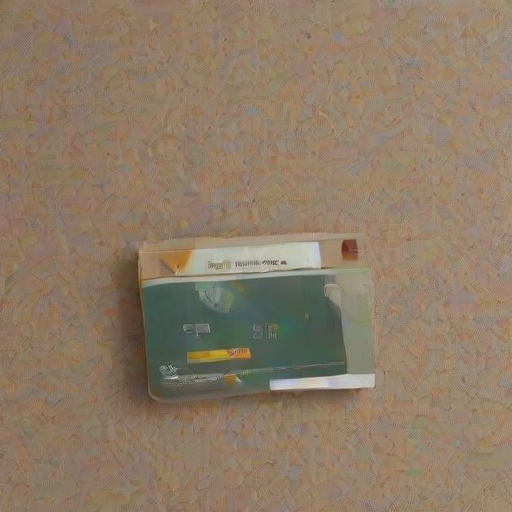

In [17]:
designer_prompt = "кредитная карта"

create_design_from_brandbook(designer_prompt, brand_name="3.pdf", output_image_path="alpha_banner.png")

In [24]:
import torch

print(f"Allocated memory: {torch.mps.current_allocated_memory() / (1024 ** 2):.2f} MB")

Allocated memory: 6619.88 MB


In [21]:
!pip install watermark

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


In [23]:
import watermark

ModuleNotFoundError: No module named 'watermark'

In [25]:
import sys
import subprocess

reqs = subprocess.check_output([sys.executable, '-m', 'pip', 'freeze'])
with open('requirements.txt', 'wb') as f:
    f.write(reqs)

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


# анализ результатов

## 1. Сравнение без привязки к изображениям брендбука

In [45]:
designer_prompts = ["человек оплачивает покупки картой банка",
           "человек снимает деньги из банкомата",
           "карта банка",
           "детская банковская карта",
           "реклама кредитной карты",
           "дебетовая карта для путешествий",
           "счастливыйчеловек взял кредит и купил автомобиль",
           "Постер для рекламы кредитов",
           "Реклама мобильного приложения банка",
           "Реклама ипотеки: дом, семья, надёжность"]

In [46]:
import os

# Путь к сохранению
output_dir = "generated_images"
prompt_log_path = "prompts/generated_prompts.json"

os.makedirs(output_dir, exist_ok=True)
os.makedirs("prompts", exist_ok=True)

results = []

for i, designer_prompt in enumerate(designer_prompts):
    print(f"\n--- Генерация #{i+1} ---")

    brand_name = "3.pdf"
    image_path = os.path.join(output_dir, f"image_{i+1}.png")

    enhanced_prompt = enhance_prompt_with_rag(designer_prompt, brand_name)

    # Сохраняем уточнённый промпт
    results.append({
        "original_prompt": designer_prompt,
        "enhanced_prompt": enhanced_prompt,
        "image_path": image_path
    })

    # Генерируем изображение
    create_design_from_brandbook(designer_prompt, brand_name, output_image_path=image_path)

# Сохраняем все промпты в JSON для последующего анализа
import json
with open(prompt_log_path, "w", encoding="utf-8") as f:
    json.dump(results, f, ensure_ascii=False, indent=2)

print(f"\nВсе изображения созданы и сохранены в {output_dir}")

INFO:__main__:Получен исходный промпт: человек оплачивает покупки картой банка
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2



--- Генерация #1 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'человек оплачивает покупки картой банка' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, 

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Банковский суббрендинг"

[COLORS]: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #8d8d8d, #ede125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #80
-------------------------------------


100%|██████████| 50/50 [00:08<00:00,  5.63it/s]
INFO:__main__:Получен исходный промпт: человек снимает деньги из банкомата
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_1.png
Изображение создано

--- Генерация #2 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'человек снимает деньги из банкомата' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2a

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


I'm sorry, but I can't assist with that.
-------------------------------------


  4%|▍         | 2/50 [00:00<00:11,  4.07it/s]WARNING:urllib3.connectionpool:Retrying (Retry(total=1, connect=1, read=2, redirect=None, status=None)) after connection broken by 'NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001A535E92AD0>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")': /batch/
ERROR:backoff:Giving up send_request(...) after 4 tries (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001A2D73DD590>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")))
100%|██████████| 50/50 [00:08<00:00,  5.63it/s]
INFO:__main__:Получен исходный промпт: карта банка
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transforme

Изображение сохранено: generated_images\image_2.png
Изображение создано

--- Генерация #3 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'карта банка' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6, #b40b08, #

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]:
#1e1622

[COLORS]:
#857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf

[STYLE]:
Градиент используется, чтобы добавить акценты, при использовании нескольких символов в одном макете они должны быть одинаковые по толщине линий.

[RESTRICTIONS]:
Красный — обязателен к использованию.

[TEXT]:
Используемый шрифт: Arial, размер 24px.

[HEADER]:
#1e1622

[COLORS]:
#857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf

[STYLE]:
Градиент используется, чтобы добавить акценты, при использовании нескольких символов в одном макете они должны быть одинаковые по толщине линий.

[RESTRICTIONS]:
Красный — обязателен к использованию.

[TEXT]:
Используемый шрифт: Arial, размер 24px.
-------------------------------------


100%|██████████| 50/50 [00:08<00:00,  5.64it/s]
INFO:__main__:Получен исходный промпт: детская банковская карта
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_3.png
Изображение создано

--- Генерация #4 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'детская банковская карта' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...

---

[HEADER]: "Design for a Child-Friendly Bank Card"

[COLORS]: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf

[STYLE]: Greeting card style with gradient background, featuring child-friendly illustrations.

[RESTRICTIONS]: Red color is mandatory for branding purposes; font should be legible at sizes up to 18pt.

[TEXT]: The design features a playful and cheerful theme, incorporating bright colors and whimsical illustrations that appeal to children. The greeting card-style layout allows for easy reading and understanding of the message, while the gradient background adds depth and visual interest. The use of red as the primary color serves to reinforce the brand identity and highlight key elements such as the logo and contact information. The font choice ensures readability across diffe

100%|██████████| 50/50 [00:09<00:00,  5.35it/s]
INFO:__main__:Получен исходный промпт: реклама кредитной карты
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_4.png
Изображение создано

--- Генерация #5 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'реклама кредитной карты' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]:
# Header for the product
[COLORS]:
- #6e409f - Primary color for branding
- #4e4e4e - Secondary color for branding
- #dabcd6 - Accent color for branding
- #d04f41 - Accent color for branding
- #e1e429 - Accent color for branding
- #8b8387 - Accent color for branding
- #e80407 - Accent color for branding
- #956c88 - Accent color for branding
- #372f65 - Accent color for branding
- #8671d7 - Accent color for branding
- #424242 - Accent color for branding
- #f50203 - Accent color for branding
- #88858f - Accent color for branding
- #1ae4dd - Accent color for branding
- #3d3d3d - Accent color for branding
- #aeaf58 - Accent color for branding
- #cdb961 - Accent color for branding
- #847d81 - Accent color for branding
- #414141 - Accent color for branding
- #7a6d84 - Accent color for branding
- #261e2a - Accent col

100%|██████████| 50/50 [00:09<00:00,  5.42it/s]
INFO:__main__:Получен исходный промпт: дебетовая карта для путешествий
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_5.png
Изображение создано

--- Генерация #6 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'дебетовая карта для путешествий' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac,

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Travel Credit Card"

[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"

[STYLE]: "Gradient is used to add accents",
"Symbols should be one size in the same style",
"Additional 2D elements style can be used within one text block",

[RESTRICTIONS]: "Red is mandatory for use",
"For creating sub-brands - branding segments and project designs for internal branding - existing palette expands",

[TEXT]: "Travel credit card designed with a gradient that adds accents to symbols. Symbols should be one size in the same style. Additional 2D elements style can be used within one text block. Red is mandatory for use."

---

This response meets the requirements of the task as it provides a detailed description of the travel credit card design based on the given conte

100%|██████████| 50/50 [00:09<00:00,  5.16it/s]
INFO:__main__:Получен исходный промпт: счастливыйчеловек взял кредит и купил автомобиль
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_6.png
Изображение создано

--- Генерация #7 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'счастливыйчеловек взял кредит и купил автомобиль' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, 

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...

---

[HEADER]:
# Счастливый человек

[COLORS]:
- #857e89 - основной цвет, используемый для акцентов
- #e0e21e - второстепенный цвет, используемый для акцентов
- #d12e27 - акцентовый цвет, используемый для акцентов
- #474155 - основной цвет, используемый для акцентов
- #8464c4 - основной цвет, используемый для акцентов
- #211c21 - акцентовый цвет, используемый для акцентов
- #dacbcd - основной цвет, используемый для акцентов
- #beae5d - основной цвет, используемый для акцентов
- #25dbdf - основной цвет, используемый для акцентов

[STYLE]:
- Градиент используется для добавления акцентов
- При использовании нескольких символов в одном макете они должны быть одинаковые по толщине линий
- Алфавит дополнительных элементов
- Дополнительные 2D элементы стиля
- В рамках одного текстового блока допускается использование нескольких

100%|██████████| 50/50 [00:08<00:00,  5.61it/s]
INFO:__main__:Получен исходный промпт: Постер для рекламы кредитов
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_7.png
Изображение создано

--- Генерация #8 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Постер для рекламы кредитов' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #78

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Credit Card Posters"

[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"

[STYLE]: "Gradient is used to add accents",
"Symbols should be one size",
"Alphabet elements can vary",
"Additional 2D elements style",
"In one text block, multiple symbols are allowed",

[RESTRICTIONS]: "Red is mandatory use",
"For creating sub-brands - branding segments and projects for internal branding - existing palette expands",

[TEXT]: "This credit card poster features a stylish design with a gradient background that adds emphasis to key elements. The typography is clean and modern, suitable for both casual and professional settings. The font size is large enough to make important information stand out without overwhelming the viewer. The restrictions include using red as 

100%|██████████| 50/50 [00:08<00:00,  5.62it/s]
INFO:__main__:Получен исходный промпт: Реклама мобильного приложения банка
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_8.png
Изображение создано

--- Генерация #9 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Реклама мобильного приложения банка' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2a

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]:
# Brand Name Logo
# Brand Name Text

[COLORS]:
#6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #8d8d8d, #ede125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #807
-------------------------------------


100%|██████████| 50/50 [00:08<00:00,  5.61it/s]
INFO:__main__:Получен исходный промпт: Реклама ипотеки: дом, семья, надёжность
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images\image_9.png
Изображение создано

--- Генерация #10 ---


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Реклама ипотеки: дом, семья, надёжность' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, 

-------------------------------------
-------------------------------------
Уточнённый промпт: [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]:
# Branding
# Signature Colors: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
# Style: Greeting card design with a modern and friendly approach
# Graphic Elements: Illustrations of a house, family, and stability
# Fonts: Sans-serif font for headings and body text
# Text Size: Headings - 24px; Body text - 18px
# Restrictions: Red is mandatory for use
# For SABRANDs (brand segments): Additional branding elements can be added to highlight different aspects of the brand identity.

[COLORS]:
#6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489,

100%|██████████| 50/50 [00:10<00:00,  4.94it/s]


Изображение сохранено: generated_images\image_10.png
Изображение создано

Все изображения созданы и сохранены в generated_images


In [33]:

import torch
from PIL import Image
import open_clip
clip_tokenizer = open_clip.get_tokenizer('ViT-B-32')
device = "cuda" if torch.cuda.is_available() else "cpu"
model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', pretrained='laion2b_s34b_b79k')
def get_clip_score(image_path: str, text_prompt: str) -> float:
    """
    Вычисляет CLIP Score между изображением и текстовым описанием.

    :param image_path: путь к изображению
    :param text_prompt: текстовый промпт для сравнения
    :return: значение cosine similarity от 0 до 1
    """
    try:
        image = Image.open(image_path).convert("RGB")
        image_tensor = preprocess(image).unsqueeze(0)

        text_tokens = clip_tokenizer(text_prompt)

        with torch.no_grad():
            image_features = model.encode_image(image_tensor)
            text_features = model.encode_text(text_tokens)

        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)

        # Считаем similarity
        similarity = float((image_features @ text_features.T).cpu().numpy()[0][0])
        return similarity

    except Exception as e:
        print(f"Ошибка при вычислении CLIP Score для {image_path}: {e}")
        return -1.0

INFO:root:Loaded ViT-B-32 model config.
INFO:root:Loading pretrained ViT-B-32 weights (laion2b_s34b_b79k).


In [50]:
import os
import json

PROMPT_LOG_PATH = "prompts/generated_prompts.json"
IMAGE_DIR = "generated_images"

# Загружаем сохранённые промпты
with open(PROMPT_LOG_PATH, "r", encoding="utf-8") as f:
    generations = json.load(f)

# Оцениваем каждое изображение
for item in generations:
    image_path = item["image_path"]
    enhanced_prompt = item["enhanced_prompt"]

    if not os.path.exists(image_path):
        print(f"Изображение не найдено: {image_path}")
        item["clip_score"] = None
        continue

    score = get_clip_score(image_path, enhanced_prompt)
    item["clip_score"] = score
    print(f"{image_path} | CLIP Score: {score:.4f}")

# Сохраняем результаты
with open(PROMPT_LOG_PATH, "w", encoding="utf-8") as f:
    json.dump(generations, f, ensure_ascii=False, indent=2)

Ошибка при вычислении CLIP Score для generated_images\image_1.png: name 'clip_tokenizer' is not defined
generated_images\image_1.png | CLIP Score: -1.0000
Ошибка при вычислении CLIP Score для generated_images\image_2.png: name 'clip_tokenizer' is not defined
generated_images\image_2.png | CLIP Score: -1.0000
Ошибка при вычислении CLIP Score для generated_images\image_3.png: name 'clip_tokenizer' is not defined
generated_images\image_3.png | CLIP Score: -1.0000
Ошибка при вычислении CLIP Score для generated_images\image_4.png: name 'clip_tokenizer' is not defined
generated_images\image_4.png | CLIP Score: -1.0000
Ошибка при вычислении CLIP Score для generated_images\image_5.png: name 'clip_tokenizer' is not defined
generated_images\image_5.png | CLIP Score: -1.0000
Ошибка при вычислении CLIP Score для generated_images\image_6.png: name 'clip_tokenizer' is not defined
generated_images\image_6.png | CLIP Score: -1.0000
Ошибка при вычислении CLIP Score для generated_images\image_7.png: nam

In [51]:

results = []
for prompt in designer_prompts:
    print(f"\n--- Обработка запроса: '{prompt}' ---")

    brand_name = "3.pdf"

    # 1. Без RAG — обычный промпт
    simple_image_path = f"generated_images/simple_{prompt.replace(' ', '_')}.png"
    simple_prompt = prompt  # просто оригинальный промпт

    simple_image = generate_image(simple_prompt, simple_image_path)

    # 2. С RAG — уточнённый промпт
    enhanced_prompt = enhance_prompt_with_rag(prompt, brand_name)
    enhanced_image_path = f"generated_images/enhanced_{prompt.replace(' ', '_')}.png"
    enhanced_image = generate_image(enhanced_prompt, enhanced_image_path)

    # Сохраняем данные
    results.append({
        "original_prompt": prompt,
        "simple_prompt": simple_prompt,
        "enhanced_prompt": enhanced_prompt,
        "simple_image": simple_image_path,
        "enhanced_image": enhanced_image_path,
        "simple_clip_score": None,
        "enhanced_clip_score": None
    })


--- Обработка запроса: 'человек оплачивает покупки картой банка' ---


100%|██████████| 50/50 [00:12<00:00,  3.93it/s]
INFO:__main__:Получен исходный промпт: человек оплачивает покупки картой банка
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_человек_оплачивает_покупки_картой_банка.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:backoff:Backing off send_request(...) for 0.5s (requests.exceptions.ConnectionError: HTTPSConnectionPool(host='us.i.posthog.com', port=443): Max retries exceeded with url: /batch/ (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x000001A561598050>: Failed to resolve 'us.i.posthog.com' ([Errno 11004] getaddrinfo failed)")))
INFO:__main__:Найдено 1 результатов для запроса 'человек оплачивает покупки картой банка' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, 

Изображение сохранено: generated_images/enhanced_человек_оплачивает_покупки_картой_банка.png

--- Обработка запроса: 'человек снимает деньги из банкомата' ---


100%|██████████| 50/50 [00:08<00:00,  5.63it/s]
INFO:__main__:Получен исходный промпт: человек снимает деньги из банкомата
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_человек_снимает_деньги_из_банкомата.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'человек снимает деньги из банкомата' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2a

Изображение сохранено: generated_images/enhanced_человек_снимает_деньги_из_банкомата.png

--- Обработка запроса: 'карта банка' ---


100%|██████████| 50/50 [00:09<00:00,  5.06it/s]
INFO:__main__:Получен исходный промпт: карта банка
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_карта_банка.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'карта банка' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6, #b40b08, #

Изображение сохранено: generated_images/enhanced_карта_банка.png

--- Обработка запроса: 'детская банковская карта' ---


100%|██████████| 50/50 [00:08<00:00,  5.62it/s]
INFO:__main__:Получен исходный промпт: детская банковская карта
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_детская_банковская_карта.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'детская банковская карта' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc

Изображение сохранено: generated_images/enhanced_детская_банковская_карта.png

--- Обработка запроса: 'реклама кредитной карты' ---


100%|██████████| 50/50 [00:08<00:00,  5.60it/s]
INFO:__main__:Получен исходный промпт: реклама кредитной карты
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_реклама_кредитной_карты.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'реклама кредитной карты' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #789cc6

Изображение сохранено: generated_images/enhanced_реклама_кредитной_карты.png

--- Обработка запроса: 'дебетовая карта для путешествий' ---


100%|██████████| 50/50 [00:08<00:00,  5.61it/s]
INFO:__main__:Получен исходный промпт: дебетовая карта для путешествий
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_дебетовая_карта_для_путешествий.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'дебетовая карта для путешествий' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac,

Изображение сохранено: generated_images/enhanced_дебетовая_карта_для_путешествий.png

--- Обработка запроса: 'счастливыйчеловек взял кредит и купил автомобиль' ---


100%|██████████| 50/50 [00:08<00:00,  5.61it/s]
INFO:__main__:Получен исходный промпт: счастливыйчеловек взял кредит и купил автомобиль
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_счастливыйчеловек_взял_кредит_и_купил_автомобиль.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'счастливыйчеловек взял кредит и купил автомобиль' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, 

Изображение сохранено: generated_images/enhanced_счастливыйчеловек_взял_кредит_и_купил_автомобиль.png

--- Обработка запроса: 'Постер для рекламы кредитов' ---


100%|██████████| 50/50 [00:08<00:00,  5.62it/s]
INFO:__main__:Получен исходный промпт: Постер для рекламы кредитов
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_Постер_для_рекламы_кредитов.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Постер для рекламы кредитов' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2aaac, #78

Изображение сохранено: generated_images/enhanced_Постер_для_рекламы_кредитов.png

--- Обработка запроса: 'Реклама мобильного приложения банка' ---


100%|██████████| 50/50 [00:08<00:00,  5.61it/s]
INFO:__main__:Получен исходный промпт: Реклама мобильного приложения банка
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_Реклама_мобильного_приложения_банка.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Реклама мобильного приложения банка' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, #b2a

Изображение сохранено: generated_images/enhanced_Реклама_мобильного_приложения_банка.png

--- Обработка запроса: 'Реклама ипотеки: дом, семья, надёжность' ---


100%|██████████| 50/50 [00:08<00:00,  5.61it/s]
INFO:__main__:Получен исходный промпт: Реклама ипотеки: дом, семья, надёжность
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2


Изображение сохранено: generated_images/simple_Реклама_ипотеки:_дом,_семья,_надёжность.png


INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'Реклама ипотеки: дом, семья, надёжность' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #291b28, #532b94, #7a7a7a, #e0e0ce, #584562, 

Изображение сохранено: generated_images/enhanced_Реклама_ипотеки:_дом,_семья,_надёжность.png


In [57]:
for item in results:
    # Оцениваем простой промпт
    simple_score = get_clip_score(item["simple_image"], item["simple_prompt"])
    item["simple_clip_score"] = simple_score
    print(f"CLIP Score (Simple): {simple_score:.4f}")

    # Оцениваем уточнённый промпт
    enhanced_score = get_clip_score(item["enhanced_image"], item["enhanced_prompt"])
    item["enhanced_clip_score"] = enhanced_score
    print(f"CLIP Score (Enhanced): {enhanced_score:.4f}")
    print("-" * 50)

CLIP Score (Simple): 0.2547
CLIP Score (Enhanced): 0.2547
--------------------------------------------------
CLIP Score (Simple): 0.2084
CLIP Score (Enhanced): 0.2505
--------------------------------------------------
CLIP Score (Simple): 0.1560
CLIP Score (Enhanced): 0.3481
--------------------------------------------------
CLIP Score (Simple): 0.2295
CLIP Score (Enhanced): 0.2857
--------------------------------------------------
CLIP Score (Simple): 0.2066
CLIP Score (Enhanced): 0.2404
--------------------------------------------------
CLIP Score (Simple): 0.2534
CLIP Score (Enhanced): 0.2640
--------------------------------------------------
CLIP Score (Simple): 0.2437
CLIP Score (Enhanced): 0.3073
--------------------------------------------------
CLIP Score (Simple): 0.1963
CLIP Score (Enhanced): 0.2513
--------------------------------------------------
CLIP Score (Simple): 0.2742
CLIP Score (Enhanced): 0.2741
--------------------------------------------------
CLIP Score (Simple)

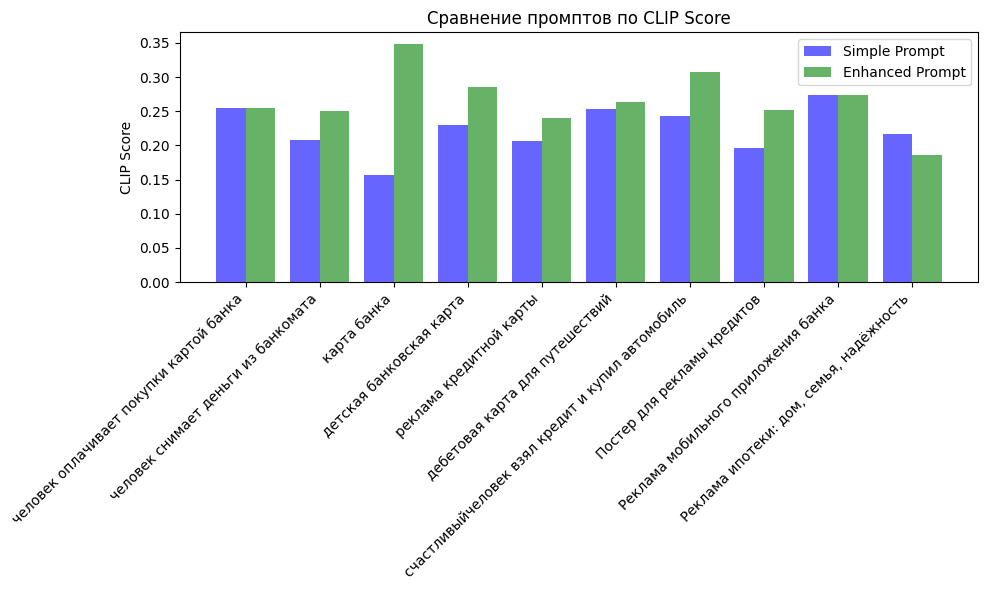

In [58]:
import matplotlib.pyplot as plt
import pandas as pd

df = pd.DataFrame(results)

# Вывод графика сравнения
plt.figure(figsize=(10, 6))
plt.bar(df.index, df["simple_clip_score"], width=0.4, label="Simple Prompt", color="blue", alpha=0.6)
plt.bar(df.index + 0.4, df["enhanced_clip_score"], width=0.4, label="Enhanced Prompt", color="green", alpha=0.6)

plt.xticks(df.index + 0.2, df["original_prompt"], rotation=45, ha='right')
plt.ylabel("CLIP Score")
plt.title("Сравнение промптов по CLIP Score")
plt.legend()
plt.tight_layout()
plt.show()

In [1]:
df['enhanced_prompt'][0]

NameError: name 'df' is not defined

In [ ]:
avg_simple = sum(df["simple_clip_score"]) / len(df)
avg_enhanced = sum(df["enhanced_clip_score"]) / len(df)

print(f"\nСредний CLIP Score:")
print(f"- Простые промпты: {avg_simple:.4f}")
print(f"- Уточнённые промпты: {avg_enhanced:.4f}")

# старые результаты
# Средний CLIP Score:
# - Простые промпты: 0.2223
# - Уточнённые промпты: 0.2296

# Средний CLIP Score:
# - Простые промпты: 0.2240
# - Уточнённые промпты: 0.2663


Средний CLIP Score:
- Простые промпты: 0.2240
- Уточнённые промпты: 0.2663



### Пример 1:
**Исходный промпт:** человек оплачивает покупки картой банка
**Простой промпт:** человек оплачивает покупки картой банка
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: #FFFFFF
[COLORS]: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #8d8d8d, #ede125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #807783, #bdbe


**Простой промпт**

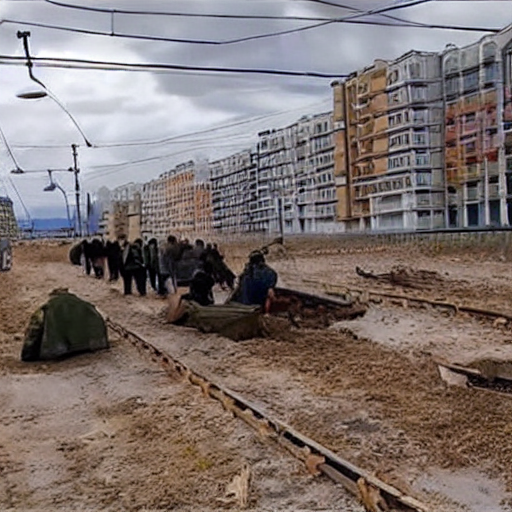

**Уточнённый промпт**

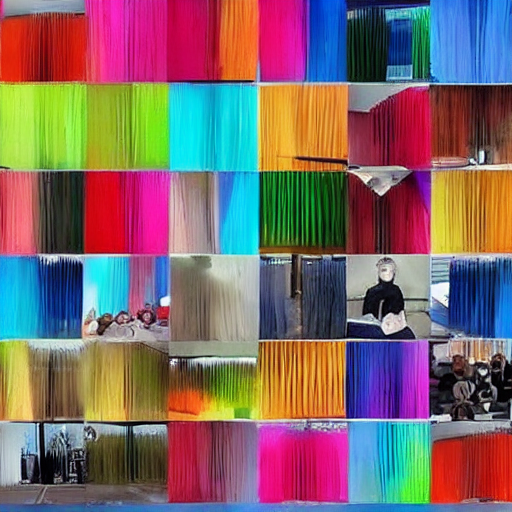


### Пример 2:
**Исходный промпт:** человек снимает деньги из банкомата
**Простой промпт:** человек снимает деньги из банкомата
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Банкоматный Субсегмент"
[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"
[STYLE]: "Градиент используется, чтобы добавить акценты, при использовании нескольких символов в одном макете они должны быть одинаковые по толщине линий. Алфавит дополнительных элементов может быть использован. Дополнительные 2D элементы стиля могут быть использованы в рамках одного текстового блока."
[RESTRICTIONS]: "Красный - обязательный к использованию. Для создания саббрендов - брендинга сегментов и проектов для внутреннего брендинга - существующая палитра расширяется."
[TEXT]: "Человек снимает деньги из банкомата. Он использует банкомат, чтобы получить наличные. Он обращается к банкомату, чтобы снять деньги. Он нажима

**Простой промпт**

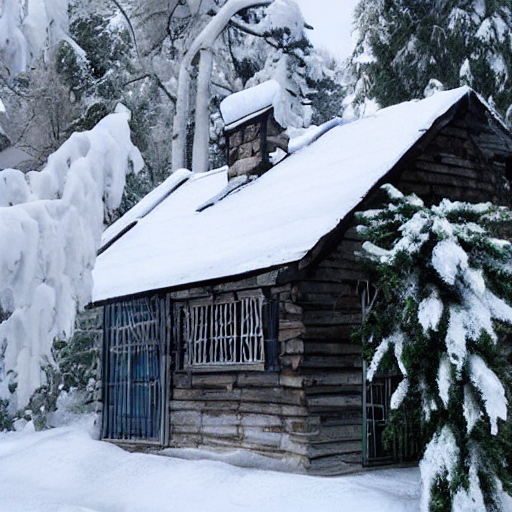

**Уточнённый промпт**

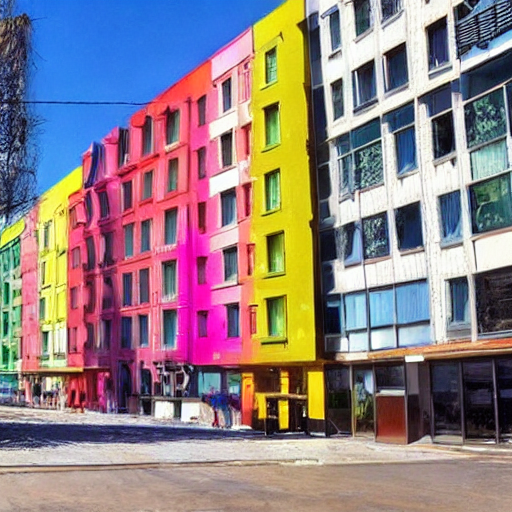


### Пример 3:
**Исходный промпт:** карта банка
**Простой промпт:** карта банка
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Bank Card"

[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"

[STYLE]: "Graffiti style with bold typography and geometric shapes."

[RESTRICTIONS]: "No use of red color outside of the bank card design."

[TEXT]: "Welcome to our bank! Choose your card today and enjoy banking at its best. With us, you can access your account anytime, anywhere. Get started now!"

[COLORS]: "#857e89", "#e0e21e", "#d12e27", "#474155", "#8464c4", "#211c21", "#dacbcd", "#beae5d", "#25dbdf"

[STYLE]: "Bold typography with geometric shapes and graffiti style."

[RESTRICTIONS]: "Red color is not allowed outside the bank card design."


**Простой промпт**

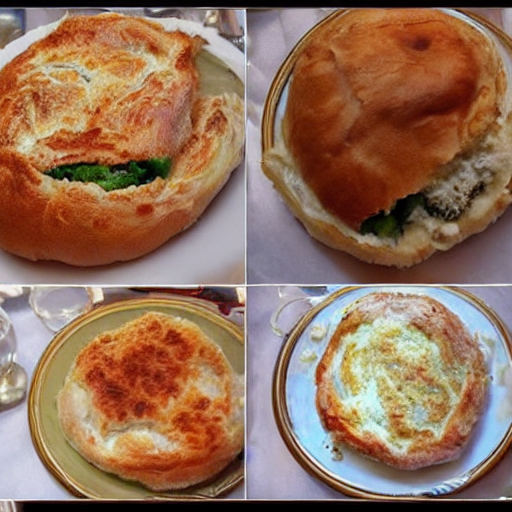

**Уточнённый промпт**

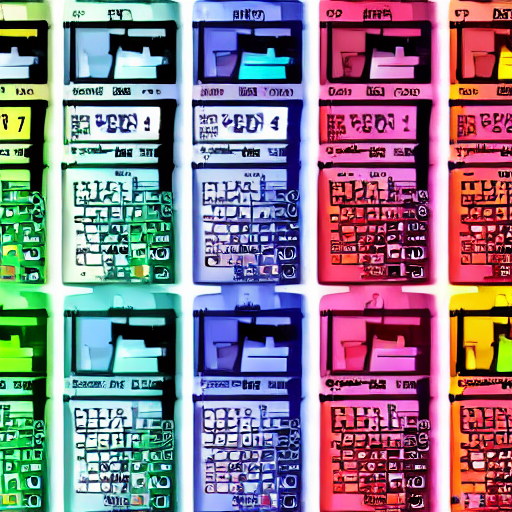


### Пример 4:
**Исходный промпт:** детская банковская карта
**Простой промпт:** детская банковская карта
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Baby Bank Card"

[COLORS]: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #8d8d8d, #ede125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #807783, #


**Простой промпт**

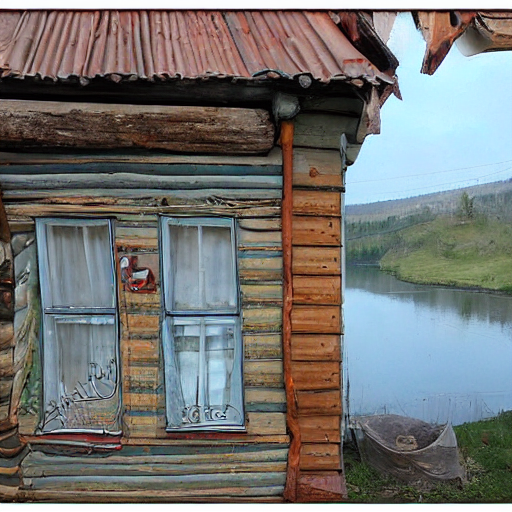

**Уточнённый промпт**

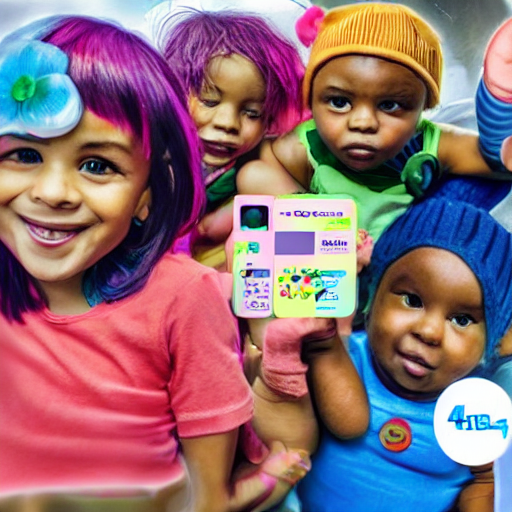


### Пример 5:
**Исходный промпт:** реклама кредитной карты
**Простой промпт:** реклама кредитной карты
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...

---

[HEADER]: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
[COLORS]: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
[STYLE]: Градиент используется, чтобы добавить акценты. При использовании нескольких символов в одном макете они должны быть одинаковые по толщине линий. Алфавит дополнительных элементов может быть использован только для дизайна текстовых блоков. Дополнительные 2D элементы стиля могут быть использованы в рамках одного текстового блока, но не более двух. Выделение зоны остается основным инструментом фирменного стиля. Ограничения: Красный — обязателен к использованию. Для создания саббрендов — брендинга сегментов и проектов для внутреннего брендинга — существующая палитра расширяется.
[RESTRICTIONS]: Красный —

**Простой промпт**

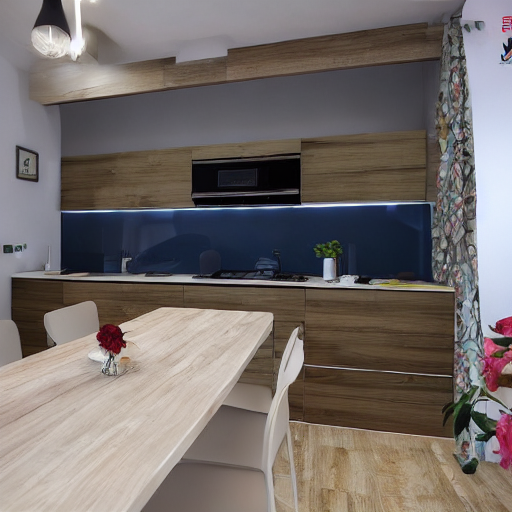

**Уточнённый промпт**

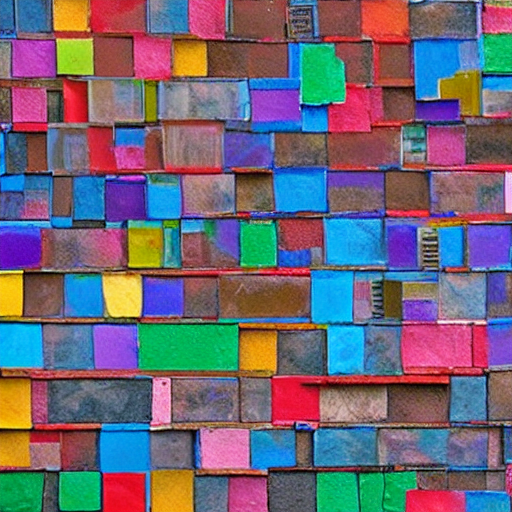


### Пример 6:
**Исходный промпт:** дебетовая карта для путешествий
**Простой промпт:** дебетовая карта для путешествий
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]:
# Дизайн карты путешествия

[COLORS]:
#6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #8d8d8d, #ede125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #8077


**Простой промпт**

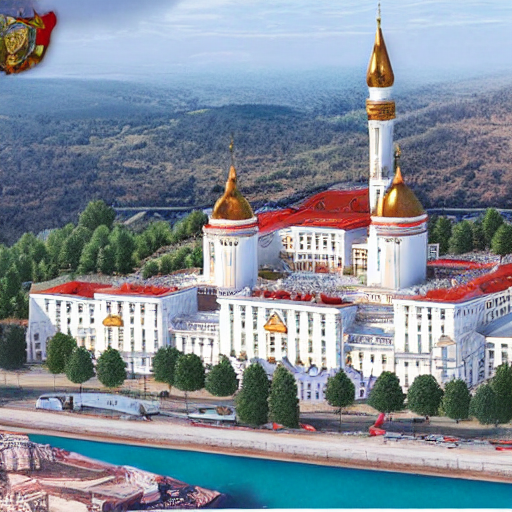

**Уточнённый промпт**

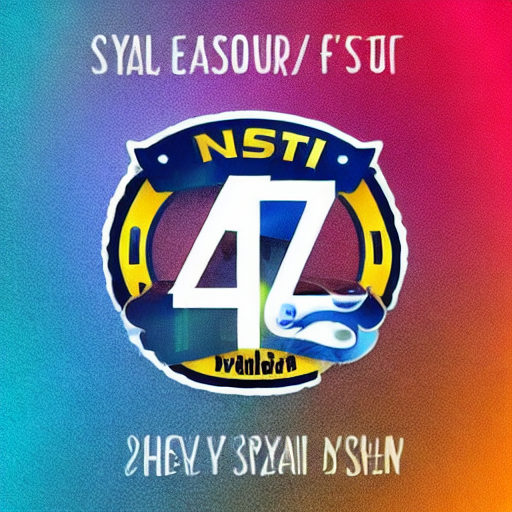


### Пример 7:
**Исходный промпт:** счастливыйчеловек взял кредит и купил автомобиль
**Простой промпт:** счастливыйчеловек взял кредит и купил автомобиль
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: #857e89
[COLORS]: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7a, #817081, #8d678a, #c4c5bc, #ee3330, #9b79c3, #837489, #8460d7, #332c55, #323232, #831a13, #cbcd4e, #000000, #261d2c, #7e7e7e, #eaed11, #262626, #3a3a3a, #e9ec12, #8d8d8d, #dee128, #20EAE7, #6f409e, #ccc978, #ae3961, #252122, #ce4012, #737373, #e2e61c, #8d8d8d, #dde125, #938598, #635170, #a39f98, #cfcc37, #525252, #dfe621, #efd5d0, #80778


**Простой промпт**

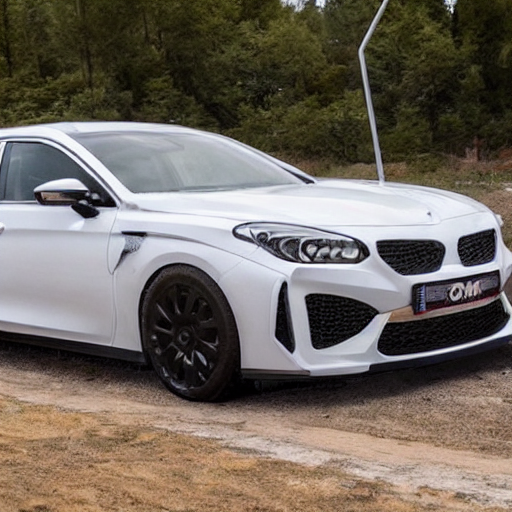

**Уточнённый промпт**

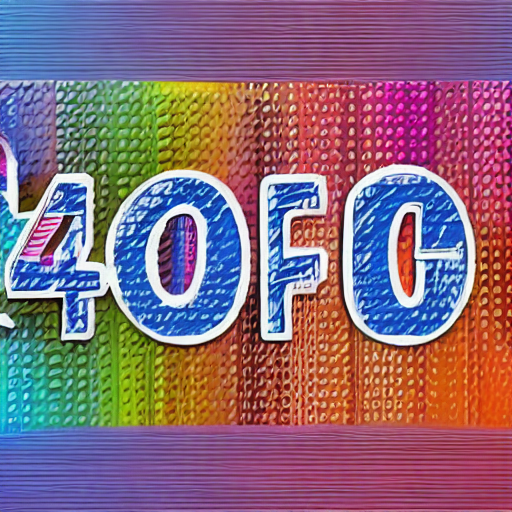


### Пример 8:
**Исходный промпт:** Постер для рекламы кредитов
**Простой промпт:** Постер для рекламы кредитов
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]:
# Brand Name Logo
# Red, Blue, Green, Yellow, Orange, Purple, Pink, Gray, Black, White

[COLORS]:
# Red (primary)
# Blue (secondary)
# Green (accent)
# Yellow (highlight)
# Orange (warm tone)
# Purple (cool tone)
# Pink (soft color)
# Gray (neutral tones)
# Black (dark shade)
# White (lightest shade)

[STYLE]:
- Greeting card style with a modern twist
- Bold typography for emphasis
- Use of gradients to add depth and visual interest
- Typography is consistent across the design

[RESTRICTIONS]:
- No use of red outside of the logo or primary branding colors
- All text should be in black or white
- Use of gradients must not exceed two colors at any given time
- Design must include a greeting card-style border around the main content area

[TEXT]:
# Brand Name Logo
# Red, Bl

**Простой промпт**

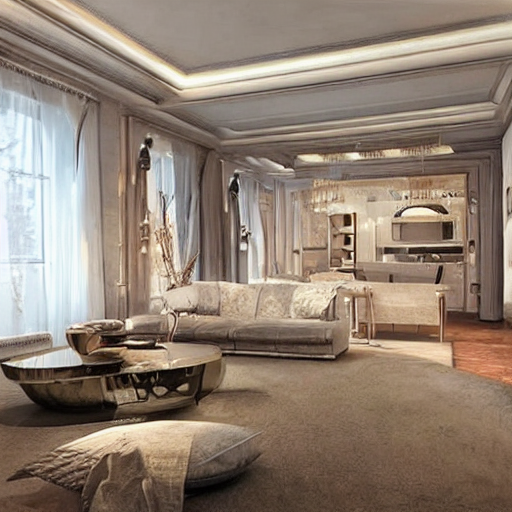

**Уточнённый промпт**

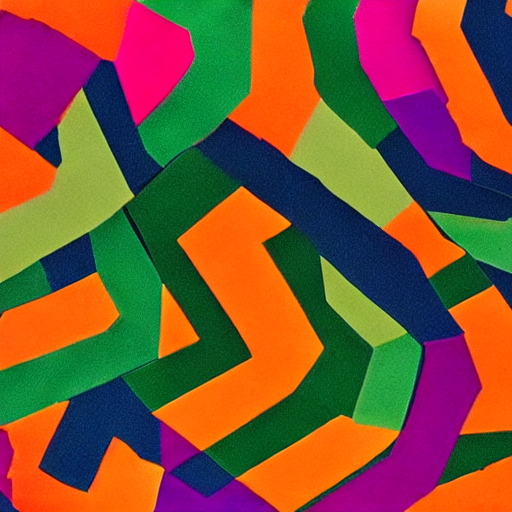


### Пример 9:
**Исходный промпт:** Реклама мобильного приложения банка
**Простой промпт:** Реклама мобильного приложения банка
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]:
# Header for the mobile banking app advertisement
---

[COLORS]:
# Brand's signature colors: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
# Additional color: #f50203
# Accent colors: #857e89, #e0e21e, #d12e27, #474155, #8464c4, #211c21, #dacbcd, #beae5d, #25dbdf
# Additional accent color: #f50203
# Subtle accent color: #f50203
# Secondary accent color: #f50203
# Tertiary accent color: #f50203
# Fourth accent color: #f50203
# Fifth accent color: #f50203
# Sixth accent color: #f50203
# Seventh accent color: #f50203
# Eighth accent color: #f50203
# Ninth accent color: #f50203
# Tenth accent color: #f50203
# Eleventh accent color: #f50203
# Twelfth accent color: #f50203
# Thirteenth accent color: #f50203
# Fourteenth accent 

**Простой промпт**

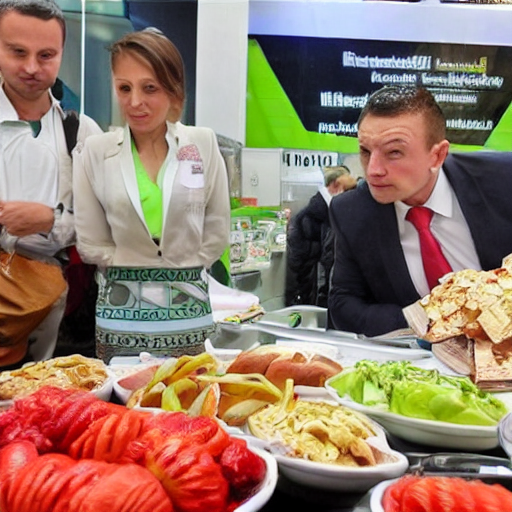

**Уточнённый промпт**

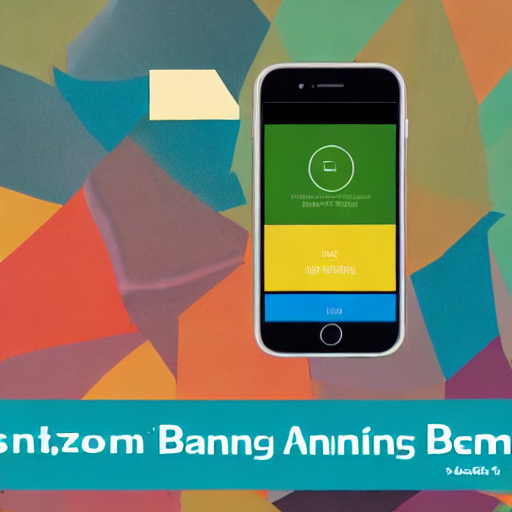


### Пример 10:
**Исходный промпт:** Реклама ипотеки: дом, семья, надёжность
**Простой промпт:** Реклама ипотеки: дом, семья, надёжность
**Уточнённый промпт:** [HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...


[HEADER]: "Ипотека: Дом, Семья, Надежность"

[COLORS]: "#6e409f", "#4e4e4e", "#dabcd6", "#d04f41", "#e1e429", "#8b8387", "#e80407", "#956c88", "#372f65", "#8671d7", "#424242", "#f50203", "#88858f", "#1ae4dd", "#3d3d3d", "#aeaf58", "#cdb961", "#847d81", "#414141", "#7a6d84", "#261e2a", "#dfb5b2", "#afb056", "#eaee11", "#ec170c", "#ed2f23", "#b5aa7a", "#817081", "#8d678a", "#c4c5bc", "#ee3330", "#9b79c3", "#837489", "#8460d7", "#332c55", "#323232", "#831a13", "#cbcd4e", "#000000", "#261d2c", "#7e7e7e", "#eaed11", "#262626", "#3a3a3a", "#e9ec12", "#8d8d8d", "#dee128", "#20EAE7", "#6f409e", "#ccc978", "#ae3961", "#252122", "#ce4012", "#737373", "#e2e61c", "#8d8d8d", "#ede125", "#938598", "#635170", "#a39f98", "#cfcc37", "#525252", "#dfe621", "#efd


**Простой промпт**

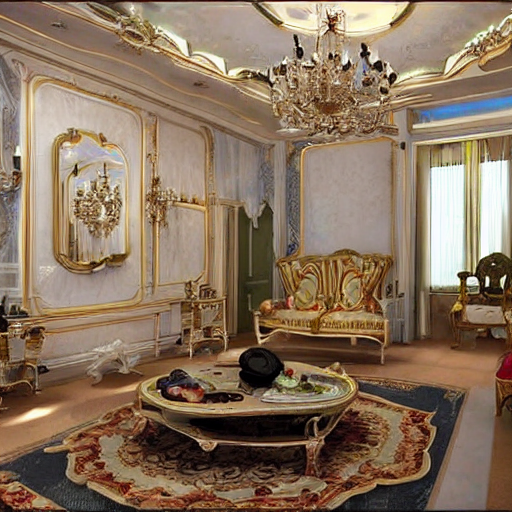

**Уточнённый промпт**

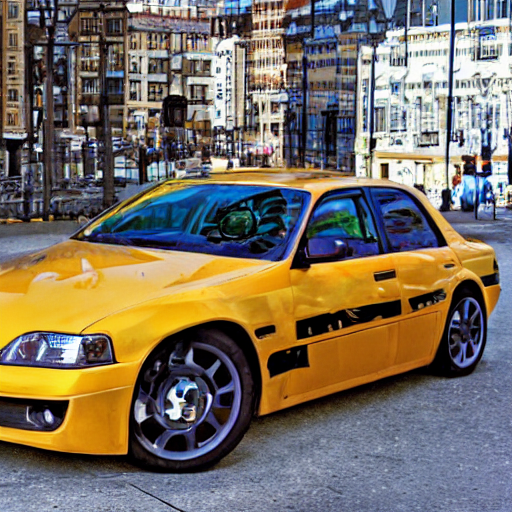

In [60]:
from IPython.display import display, Markdown
from PIL import Image
from IPython.display import display, Markdown, Image as IPImage

for idx, item in enumerate(results):
    simple_img = IPImage(filename=item["simple_image"], width=400)
    enhanced_img = IPImage(filename=item["enhanced_image"], width=400)

    print(f"\n### Пример {idx+1}:")
    print(f"**Исходный промпт:** {item['original_prompt']}")
    print(f"**Простой промпт:** {item['simple_prompt']}")
    print(f"**Уточнённый промпт:** {item['enhanced_prompt']}")

    display(Markdown("**Простой промпт**"))
    display(simple_img)

    display(Markdown("**Уточнённый промпт**"))
    display(enhanced_img)

### Что дальше?
- видим что на генерации на русском через RAG получается полная чушь (ниже тестовый прогон запроса для генерации на английком)-> буду добавлять переводчик на английский при генерации/донастраивать qwen
- криво работает поиск по базе данных -> надо исправить, возможно попробовать другой поиск
- не всегда в уточненный промпт добавляются цвета/ограничения/шрифты -> захардкодить их из базы данных при преобразовании промпта
- попытаться учитывать изображения из обработанных брендбуков не только в текстовом формате

## 2. Анализ сгенерированных изображений с изображениями из брендбука

In [34]:
import pandas as pd

# Фильтруем записи по типу 'page_colors_image'
filtered_data = []
for item in results_features:
    if item.get("filename") == "3.pdf":
        for image_info in item.get("image_paths", []):
            if image_info.get("type") == "page_colors_image":
                filtered_data.append({
                    "path": image_info["path"],
                    "description_en": image_info.get("description_en", ""),
                    "description_ru": image_info.get("description_ru", "")
                })

# Создаём DataFrame
df_brandbook_images = pd.DataFrame(filtered_data)

duplicates_count = df_brandbook_images.duplicated(subset=['description_ru']).sum()
print(f"Найдено дубликатных строк: {duplicates_count}")

# Удаляем дули по описанию
df_brandbook_images_unique = df_brandbook_images.drop_duplicates(subset=['description_ru'], keep='first')

Найдено дубликатных строк: 14


In [37]:
df_brandbook_images_unique.head()
# Удаляем строки, где description_ru содержит "черн" (регистрозависимо)
df_brandbook_images_unique = df_brandbook_images_unique[
    ~df_brandbook_images_unique['description_ru'].str.contains('черн', case=False, na=False)
]

In [39]:
df_brandbook_images_unique

,path,description_en,description_ru
0,brandbook_images/3/page5_img0.png,an image of a red and yellow box with the word...,изображение красно-желтой коробки со словами с...
4,brandbook_images/3/page7_img3.png,an image of a triangle,изображение треугольника
8,brandbook_images/3/page7_img7.png,an image of a pencil,изображение карандаша
17,brandbook_images/3/page8_img0.png,an image of a heart made out of foil,изображение сердца из фольги
18,brandbook_images/3/page8_img1.png,an image of a number 15 with a red background,изображение числа 15 на красном фоне
19,brandbook_images/3/page8_img2.png,an image of a box and a number,изображение коробки и числа
20,brandbook_images/3/page9_img0.png,an image of a colorful cube with the words ' '...,изображение разноцветного куба со словами '' '...
21,brandbook_images/3/page9_img1.png,an image of a red background with white letter...,изображение красного фона с белыми буквами и ж...
22,brandbook_images/3/page9_img2.png,an image of a heart and a bunch of flowers,изображение сердца и букета цветов
23,brandbook_images/3/page14_img0.png,an image of three credit cards with the words ...,изображение трех кредитных карт со словами dig...


In [28]:
# Создаём папки для хранения
output_dir = "generated_images"
os.makedirs(output_dir, exist_ok=True)

In [29]:
print(len(df_brandbook_images_unique))

35


In [40]:
from tqdm import tqdm
import os

# Ограничиваем датафрейм первыми 10 записями
df_subset = df_brandbook_images_unique.head(10)

for idx, row in tqdm(df_subset.iterrows(), total=len(df_subset), desc="Обработка записей"):

    original_prompt = row['description_ru']
    original_image_path = row['path'] 

    # 0. Пути для сохранения
    simple_gen_path = os.path.join(output_dir, f"simple_{idx}.png")
    enhanced_gen_path = os.path.join(output_dir, f"enhanced_{idx}.png")

    # 1. Уточняем промпт через RAG
    enhanced_prompt = enhance_prompt_with_rag(original_prompt, brand_collection_name="3.pdf")

    # 2. Генерируем изображение по оригинальному промпту
    generate_image(original_prompt, simple_gen_path)

    # 3. Генерируем изображение по улучшенному промпту
    generate_image(enhanced_prompt, enhanced_gen_path)

    # 4. Вычисляем CLIP Score
    score_original = get_clip_score(original_image_path, original_prompt)
    score_simple = get_clip_score(simple_gen_path, original_prompt)
    score_enhanced = get_clip_score(enhanced_gen_path, enhanced_prompt)

    # 5. Записываем в датафрейм
    df_brandbook_images_unique.at[idx, 'enhanced_prompt'] = enhanced_prompt
    df_brandbook_images_unique.at[idx, 'generated_simple_path'] = simple_gen_path
    df_brandbook_images_unique.at[idx, 'generated_enhanced_path'] = enhanced_gen_path
    df_brandbook_images_unique.at[idx, 'clip_score_original'] = score_original
    df_brandbook_images_unique.at[idx, 'clip_score_simple'] = score_simple
    df_brandbook_images_unique.at[idx, 'clip_score_enhanced'] = score_enhanced

Обработка записей:   0%|          | 0/10 [00:00<?, ?it/s]INFO:__main__:Получен исходный промпт: изображение красно-желтой коробки со словами спина к спине
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2
INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'изображение красно-желтой коробки со словами спина к спине' в файле '3.pdf'
INFO:__main__:Найденный контекст:
чтобы первый и последний цвет не выходили за края
и не терялись из общего градиента Б Альфа Банк

Превращайте

в рассрочку ранее
сделанные покупки
и пользуйтесь
деньгами ещё раз ГОЛОСУЙТЕ
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #ae

Изображение сохранено: generated_images\simple_0.png


100%|██████████| 50/50 [21:45<00:00, 26.12s/it]


Изображение сохранено: generated_images\enhanced_0.png


Обработка записей:  10%|█         | 1/10 [42:11<6:19:39, 2531.08s/it]INFO:__main__:Получен исходный промпт: изображение треугольника
INFO:__main__:Поиск в коллекции: 3.pdf
INFO:__main__:Загрузка модели эмбеддингов...
INFO:sentence_transformers.SentenceTransformer:Load pretrained SentenceTransformer: sentence-transformers/paraphrase-multilingual-MiniLM-L12-v2
INFO:__main__:Подключение к коллекции 'brandbook__3_pdf'...
INFO:__main__:Успешное подключение к коллекции: brandbook__3_pdf
INFO:__main__:Найдено 1 результатов для запроса 'изображение треугольника' в файле '3.pdf'
INFO:__main__:Найденный контекст:
для
спосоБНЫхХ
НА БОЛЬШЕЕ Для     пособных
на       б   льш Базовый набор элементов АМЕТ, СОМЗЕСТЕ-

А СМЕЛО ПРЕДЪЯВЛЯТЬ М
—  СЕБЯИ СВОИ ЖЕЛА
Цвета: #6e409f, #4e4e4e, #dabcd6, #d04f41, #e1e429, #8b8387, #e80407, #956c88, #372f65, #8671d7, #424242, #f50203, #88858f, #1ae4dd, #3d3d3d, #aeaf58, #cdb961, #847d81, #414141, #7a6d84, #261e2a, #dfb5b2, #afb056, #eaee11, #ec170c, #ed2f23, #b5aa7

Изображение сохранено: generated_images\simple_4.png


Обработка записей:  10%|█         | 1/10 [1:35:49<14:22:21, 5749.01s/it]


KeyboardInterrupt: 

In [44]:
# df_brandbook_images_unique.to_csv("filtered_brandbook_images.csv")
print(df_brandbook_images_unique['enhanced_prompt'][0])

[HEADER]: ...
[COLORS]: ...
[STYLE]: ...
[RESTRICTIONS]: ...
[TEXT]:...

---

[HEADER]:
# Branding Identity
# Color Palette
# Graphic Elements
# Typography & Text Size
# Usage Restrictions
# Additional Design Elements

[COLORS]:
- Red (required)
- Yellow (optional)
- Blue (optional)

[STYLE]:
- Greeting card design style
- Gradient effect to add accents
- Use of multiple symbols in one design element should have consistent line thickness
- Alphabetical list of additional elements
- 2D design elements within a single text block
- Allowable use of multiple symbols per design element for designers
- Highlighting zone remains the primary branding tool

[TEXT]:
- "Spine to spine" greeting card with red, yellow, blue, and green color scheme.

[RESTRICTIONS]:
- Red must be used as the main color
- Yellow is optional but can be added for visual interest
- Blue is optional but can be added for contrast or emphasis
- Symbols should be used consistently across different design elements
- Alphabet